# IMPORT AND BASIC INFO

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Setting aesthetic parameters for visually appealing plots
sns.set(style="whitegrid")  # Using a clean and professional style
plt.rcParams['figure.figsize'] = (13, 7) # Increasing the figure size for better readability
plt.rcParams['axes.titlesize'] = 20 # Larger titles for emphasis
plt.rcParams['axes.labelsize'] = 15 # Readable axis labels
plt.rcParams['xtick.labelsize'] = 13 # Readable x-axis tick labels
plt.rcParams['ytick.labelsize'] = 13 # Readable y-axis tick labels

# Loading the dataset
df = pd.read_csv("data.csv")

# Displaying initial rows and dataset summary
print("Displaying the first few rows of the dataset:")
print(df.head())

print("\nHigh-level overview of dataset characteristics:")
df.info()

print("\nStatistical summary of the numerical variables:")
print(df.describe())

Displaying the first few rows of the dataset:
   Unnamed: 0  acousticness  danceability  duration_ms  energy  \
0           0        0.0102         0.833       204600   0.434   
1           1        0.1990         0.743       326933   0.359   
2           2        0.0344         0.838       185707   0.412   
3           3        0.6040         0.494       199413   0.338   
4           4        0.1800         0.678       392893   0.561   

   instrumentalness  key  liveness  loudness  mode  speechiness    tempo  \
0          0.021900    2    0.1650    -8.795     1       0.4310  150.062   
1          0.006110    1    0.1370   -10.401     1       0.0794  160.083   
2          0.000234    2    0.1590    -7.148     1       0.2890   75.044   
3          0.510000    5    0.0922   -15.236     1       0.0261   86.468   
4          0.512000    5    0.4390   -11.648     0       0.0694  174.004   

   time_signature  valence  target      song_title            artist  
0             4.0    0.286   

# Dataset Cleaning

In [38]:
# Inspecting missing values in each column
print("Distribution of missing values across columns:\n", df.isnull().sum())

# Detecting the presence of duplicate records.
print("\nTotal count of duplicated entries prior to de-duplication:", df.duplicated().sum())

# Removing duplicate rows from the dataset
df.drop_duplicates(inplace=True)

# Confirming that duplicates have been successfully removed.
print("Total count of duplicated entries post de-duplication:", df.duplicated().sum())

Distribution of missing values across columns:
 Unnamed: 0          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
target              0
song_title          0
artist              0
dtype: int64

Total count of duplicated entries prior to de-duplication: 0
Total count of duplicated entries post de-duplication: 0


# Outlier Diagnostic and Treatment

Outlier count in 'acousticness': 194
Outlier count in 'danceability': 12
Outlier count in 'duration_ms': 141
Outlier count in 'energy': 54
Outlier count in 'instrumentalness': 416
Outlier count in 'key': 0
Outlier count in 'liveness': 126
Outlier count in 'loudness': 105
Outlier count in 'mode': 0
Outlier count in 'speechiness': 209
Outlier count in 'tempo': 15
Outlier count in 'time_signature': 126
Outlier count in 'valence': 0


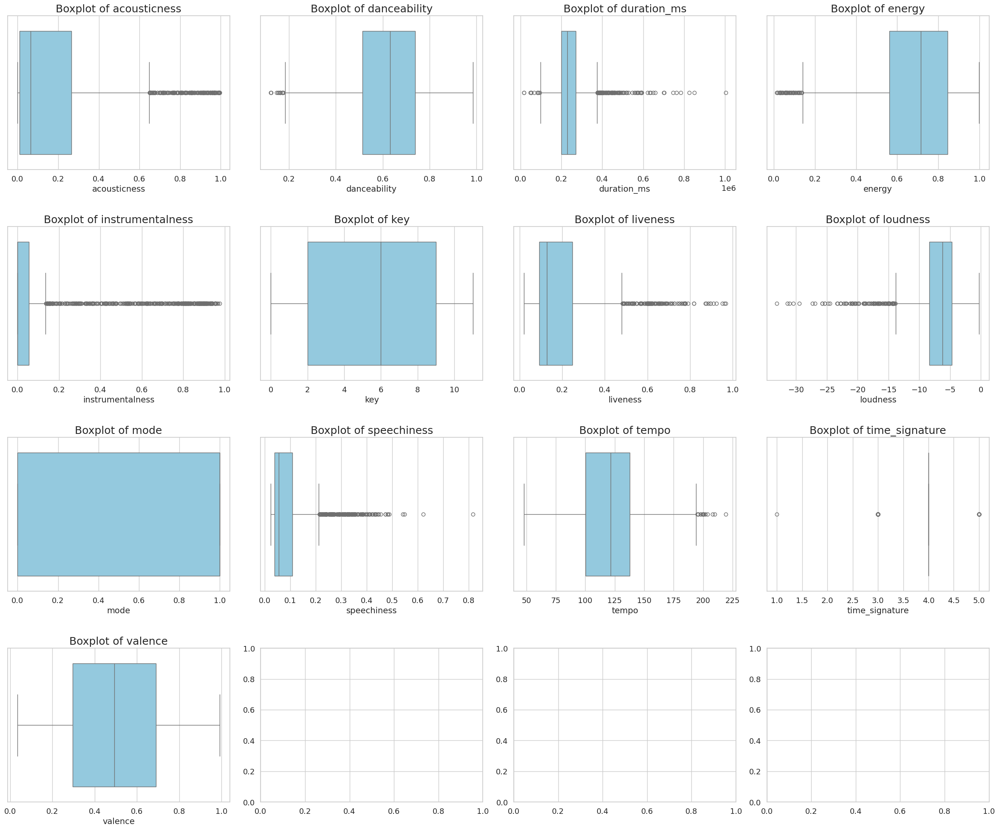

Handled all outliers in 'acousticness'
Handled all outliers in 'danceability'
Handled all outliers in 'duration_ms'
Handled all outliers in 'energy'
Handled all outliers in 'instrumentalness'
Handled all outliers in 'key'
Handled all outliers in 'liveness'
Handled all outliers in 'loudness'
Handled all outliers in 'mode'
Handled all outliers in 'speechiness'
Handled all outliers in 'tempo'
Handled all outliers in 'time_signature'
Handled all outliers in 'valence'


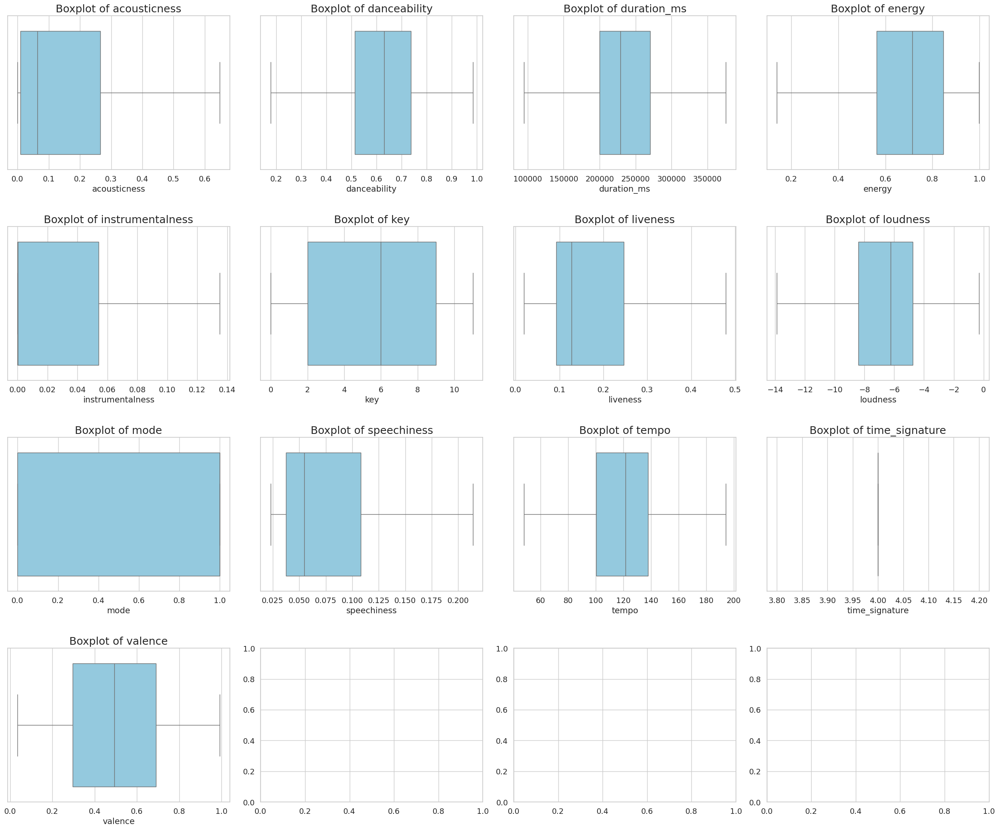

In [39]:
# Detecting outliers using IQR method
def find_outliers_iqr(df, column_name):
    """Utility function to detect outliers using the IQR method."""
    q1 = df[column_name].quantile(0.25)
    q3 = df[column_name].quantile(0.75)
    iqr = q3 - q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    return (df[column_name] < lower_bound) | (df[column_name] > upper_bound)

# Identifying the columns with numeric values
numeric_features = ['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']
outlier_counts = {}

# Detecting outliers across numerical features
for feature in numeric_features:
    outlier_counts[feature] = find_outliers_iqr(df, feature).sum()
    print(f"Outlier count in '{feature}': {outlier_counts[feature]}")

# Visualizing outliers using box plots
rows = 4
columns = 4
fig, axes = plt.subplots(rows, columns, figsize=(24, 20))

# Flatten axes for easier access
axes = axes.flatten()

# Creating box plots
for i, feature in enumerate(numeric_features):
    sns.boxplot(x=df[feature], ax=axes[i], color='skyblue')
    axes[i].set_title(f'Boxplot of {feature}', fontsize=18)
    axes[i].set_xlabel(feature, fontsize=14)

plt.tight_layout(pad=2, w_pad=1, h_pad=3.0)
plt.show()

def cap_outliers_iqr(df, column_name):
    """Utility function to impute outliers using the IQR method."""
    q1 = df[column_name].quantile(0.25)
    q3 = df[column_name].quantile(0.75)
    iqr = q3 - q1
    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr

    df[column_name] = np.where(df[column_name] > upper_boundary, upper_boundary, df[column_name])
    df[column_name] = np.where(df[column_name] < lower_boundary, lower_boundary, df[column_name])

# Handle the outliers
for column in numeric_features:
    cap_outliers_iqr(df, column)
    print(f"Handled all outliers in '{column}'")

# Plot box plot AFTER handling outliers.
rows = 4
columns = 4
fig, axes = plt.subplots(rows, columns, figsize=(24, 20))

# Flatten axes for easier access
axes = axes.flatten()

for i, feature in enumerate(numeric_features):
    sns.boxplot(x=df[feature], ax=axes[i], color='skyblue')
    axes[i].set_title(f'Boxplot of {feature}', fontsize=18)
    axes[i].set_xlabel(feature, fontsize=14)

plt.tight_layout(pad=2, w_pad=1, h_pad=3.0)
plt.show()

# Initial Exploratory Investigation



Revisited statistical summary of numerical features after outlier handling:
       acousticness  danceability    duration_ms       energy  \
count   2017.000000   2017.000000    2017.000000  2017.000000   
mean       0.169130      0.618548  240209.013882     0.683336   
std        0.213583      0.160669   60026.149847     0.205312   
min        0.000003      0.178000   94538.000000     0.138500   
25%        0.009630      0.514000  200015.000000     0.563000   
50%        0.063300      0.631000  229261.000000     0.715000   
75%        0.265000      0.738000  270333.000000     0.846000   
max        0.648055      0.984000  375810.000000     0.998000   

       instrumentalness          key     liveness     loudness         mode  \
count       2017.000000  2017.000000  2017.000000  2017.000000  2017.000000   
mean           0.034006     5.342588     0.180407    -6.833761     0.612295   
std            0.055203     3.648240     0.124404     2.908712     0.487347   
min            0.0000

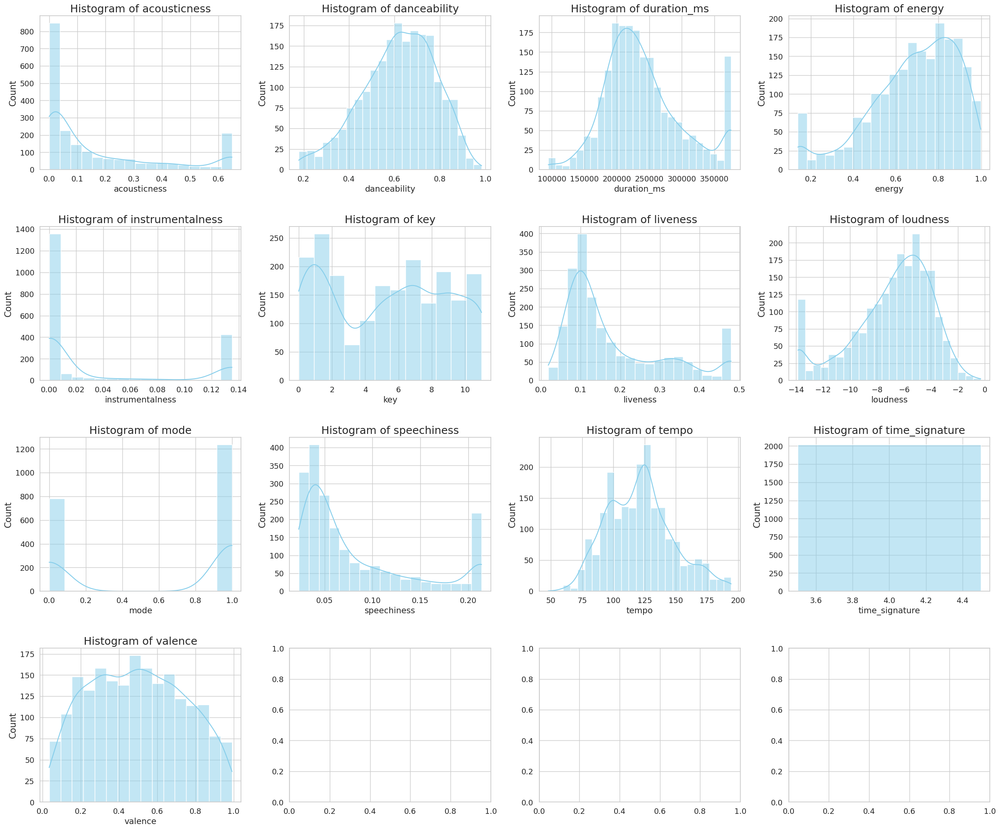

In [40]:
# Descriptive statistics for numerical variables
print("\nRevisited statistical summary of numerical features after outlier handling:")
print(df[numeric_features].describe())

# Calculating frequencies in every discrete feature
discrete_features = ['key', 'mode', 'time_signature', 'target']

# Frequency distributions of these
for column in discrete_features:
    print(f"\nDistribution of frequency in column '{column}':")
    print(df[column].value_counts())

# Histograms to visualize data distributions
rows = 4
columns = 4
fig, axes = plt.subplots(rows, columns, figsize=(24, 20))
axes = axes.flatten()

for i, column in enumerate(numeric_features):
    sns.histplot(df[column], kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Histogram of {column}', fontsize=18)
    axes[i].set_xlabel(column, fontsize=14)

plt.tight_layout(pad=2, w_pad=1, h_pad=3.0)
plt.show()

# Analysis Between Multiple Variables

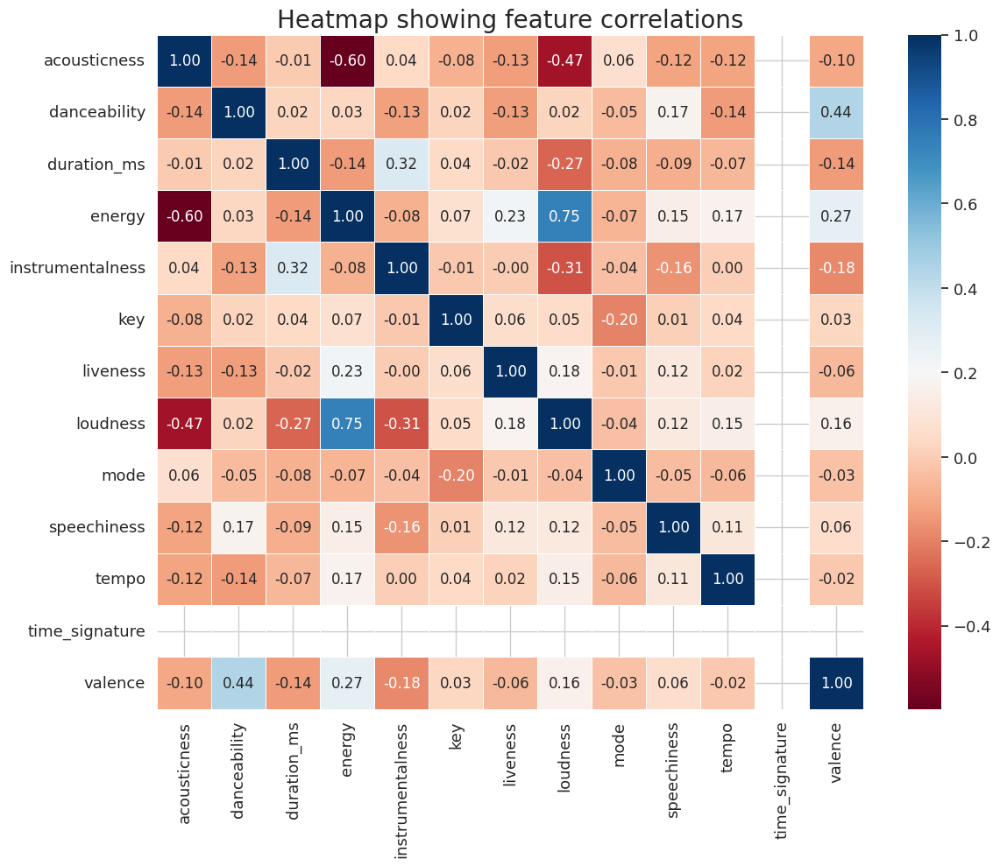

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable h

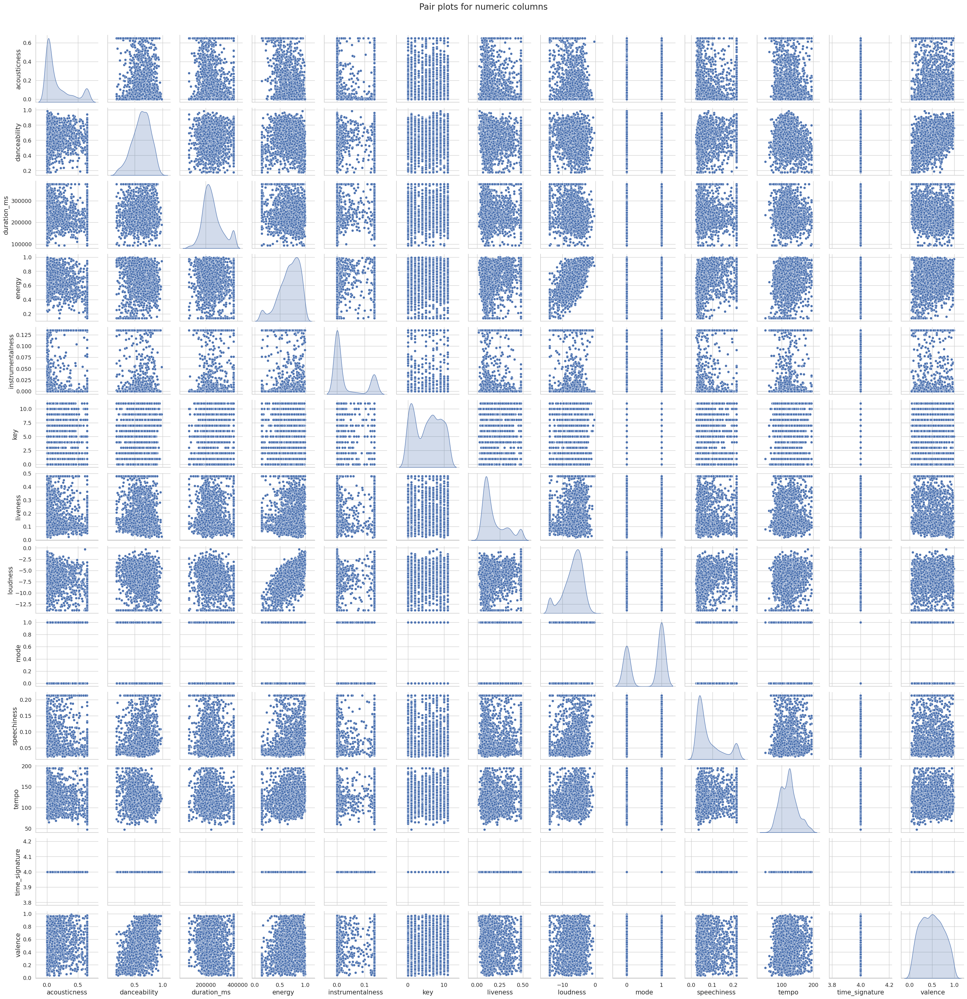

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


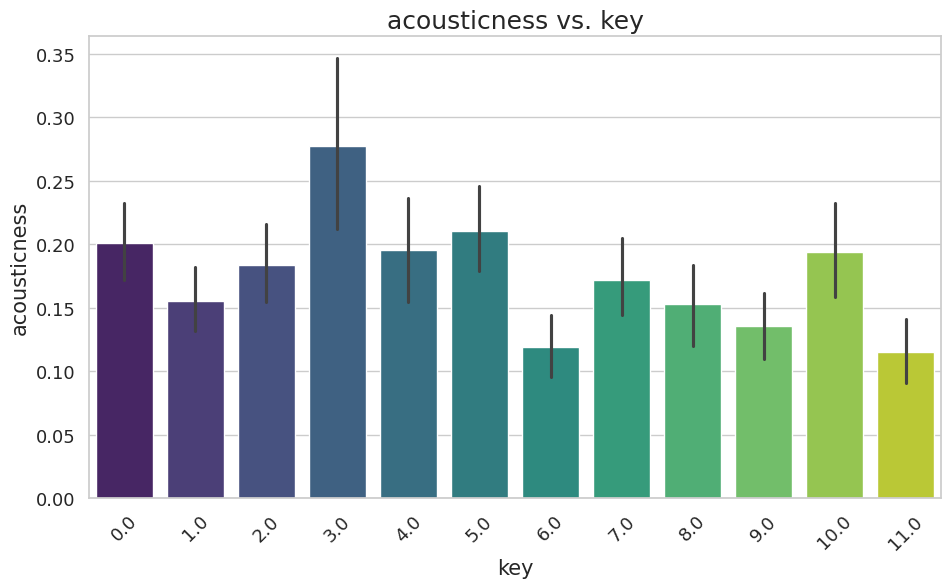

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


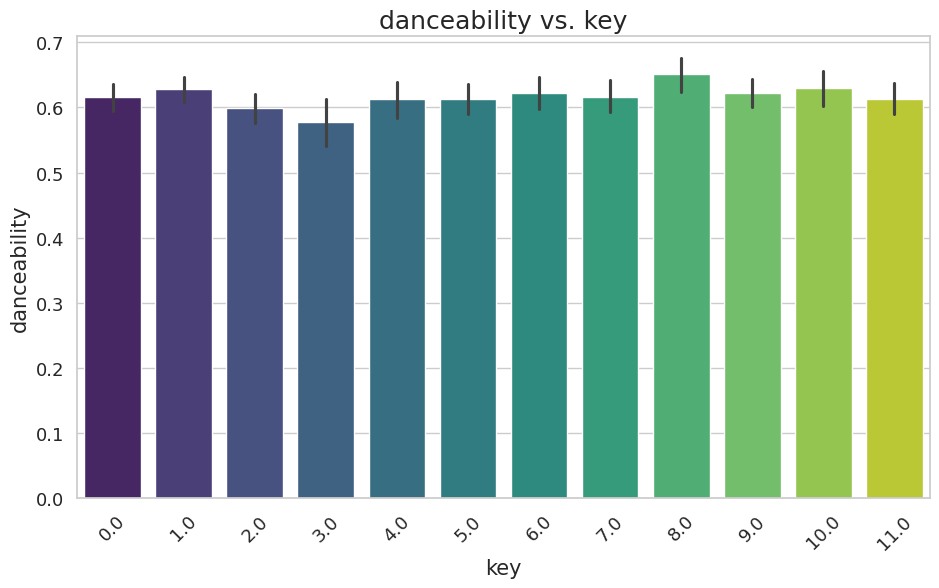

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


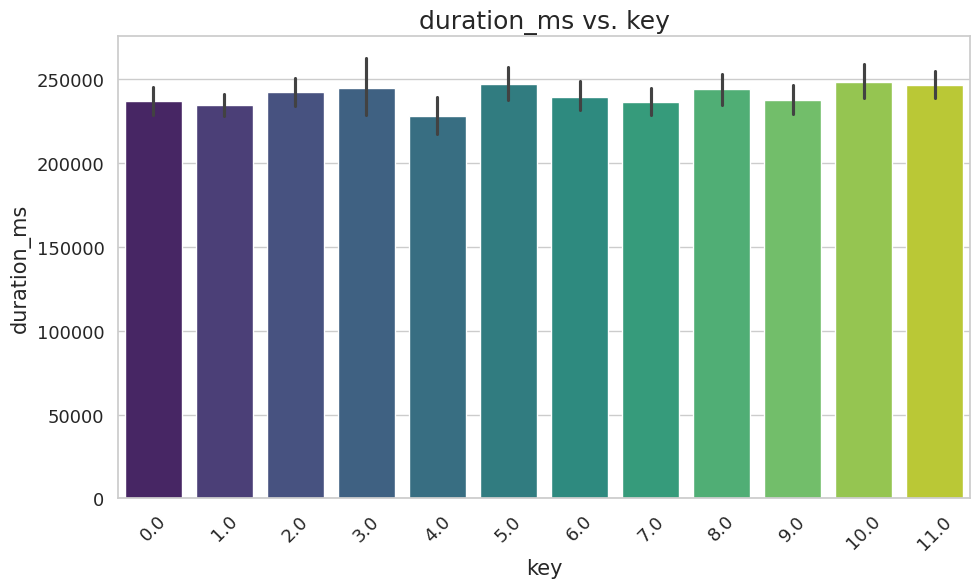

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


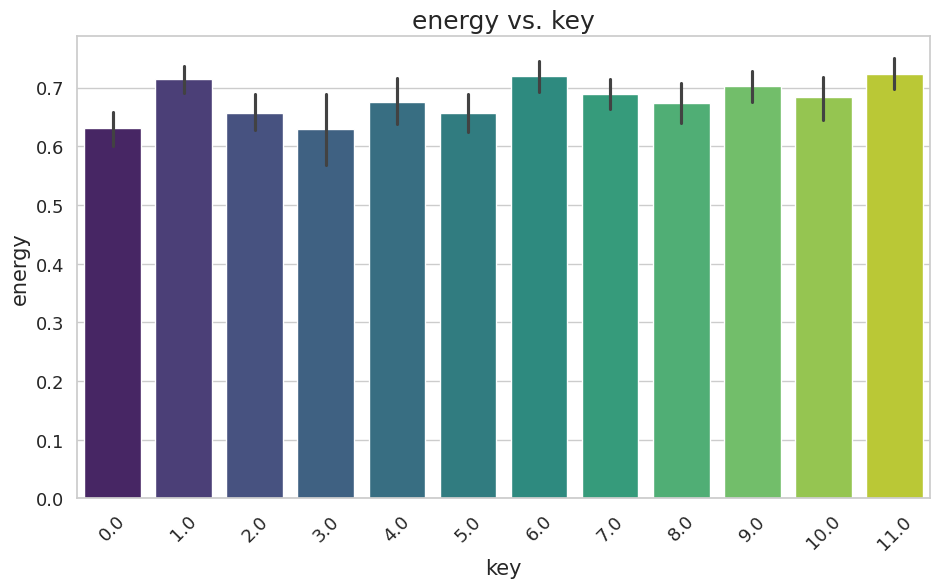

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


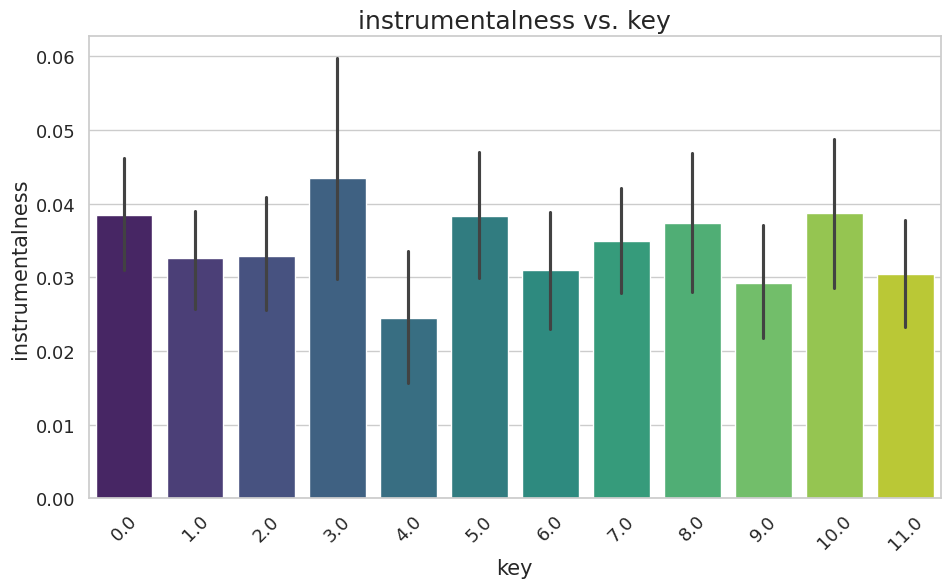

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


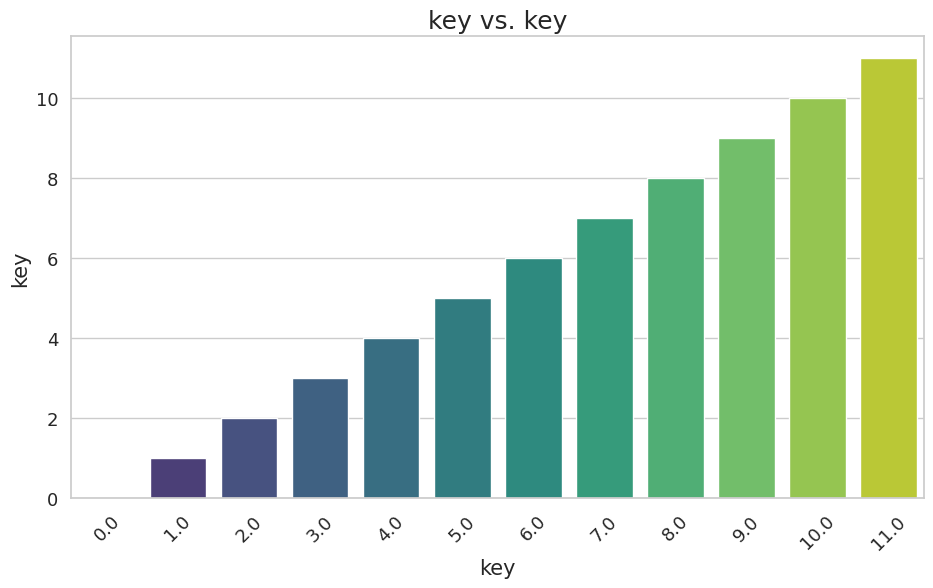

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


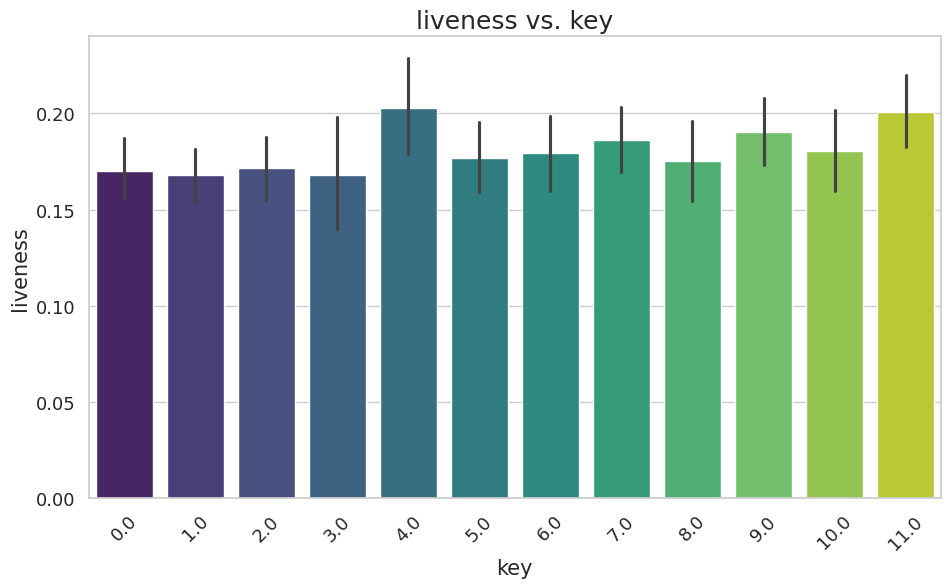

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


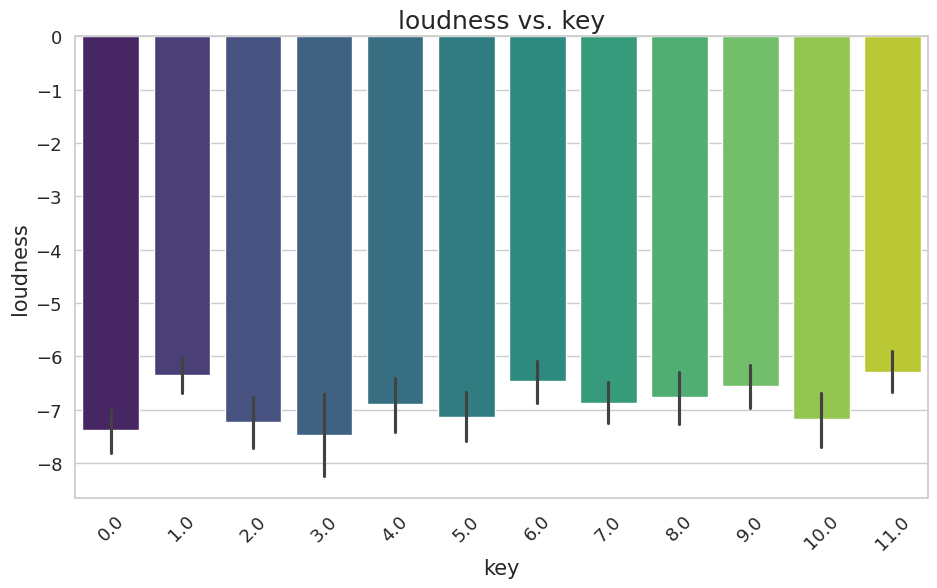

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


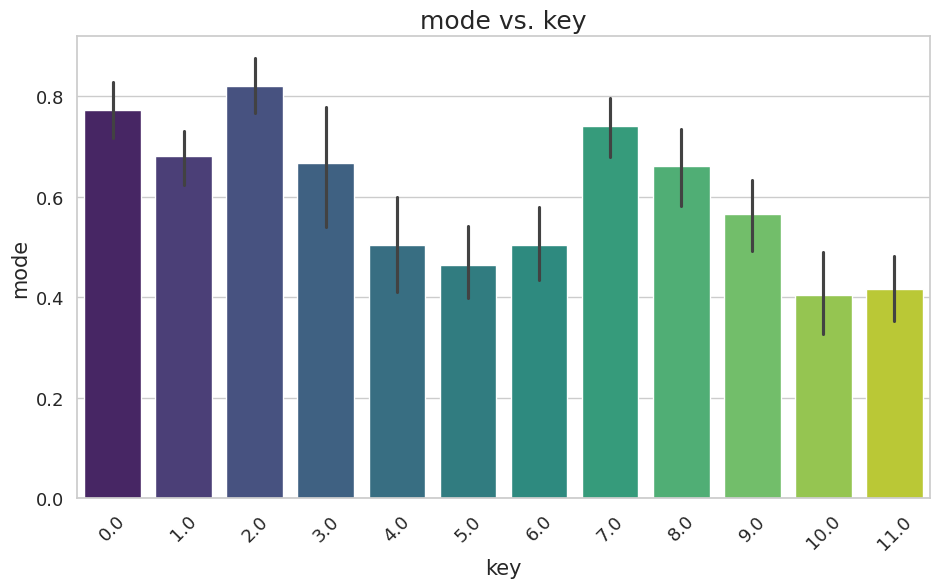

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


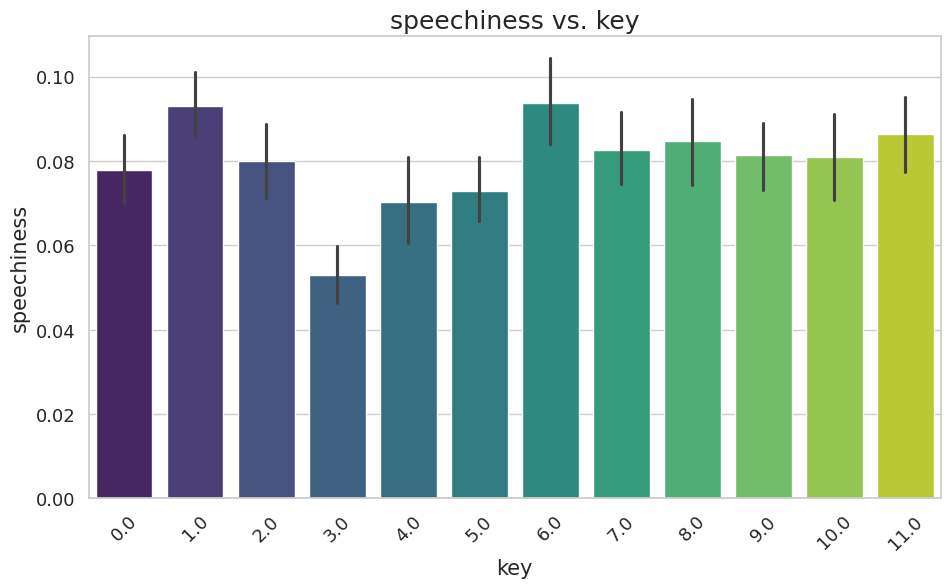

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


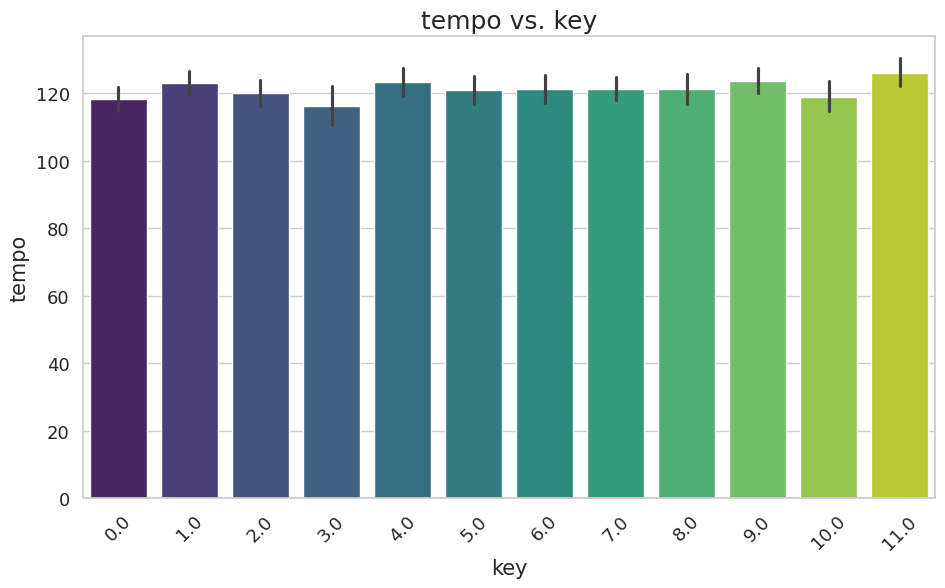

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


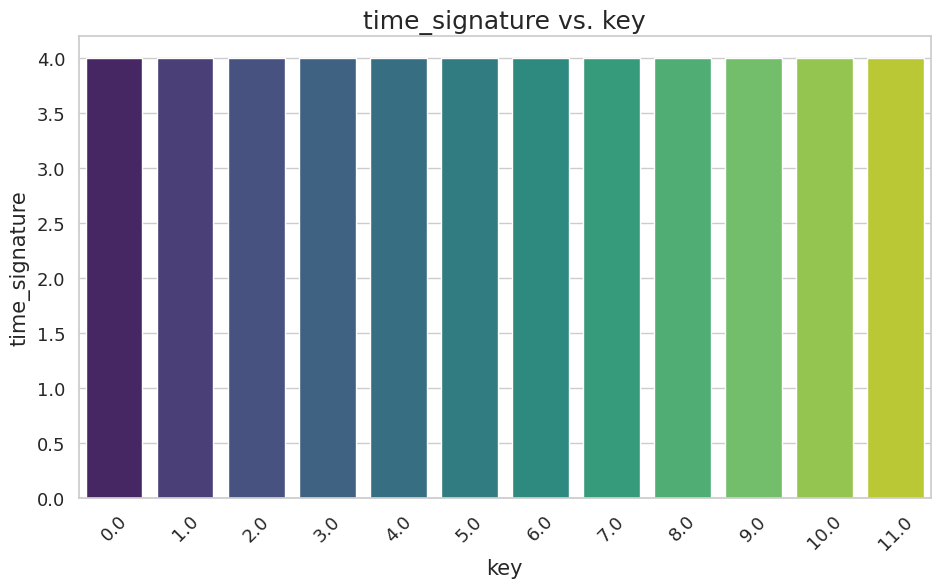

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


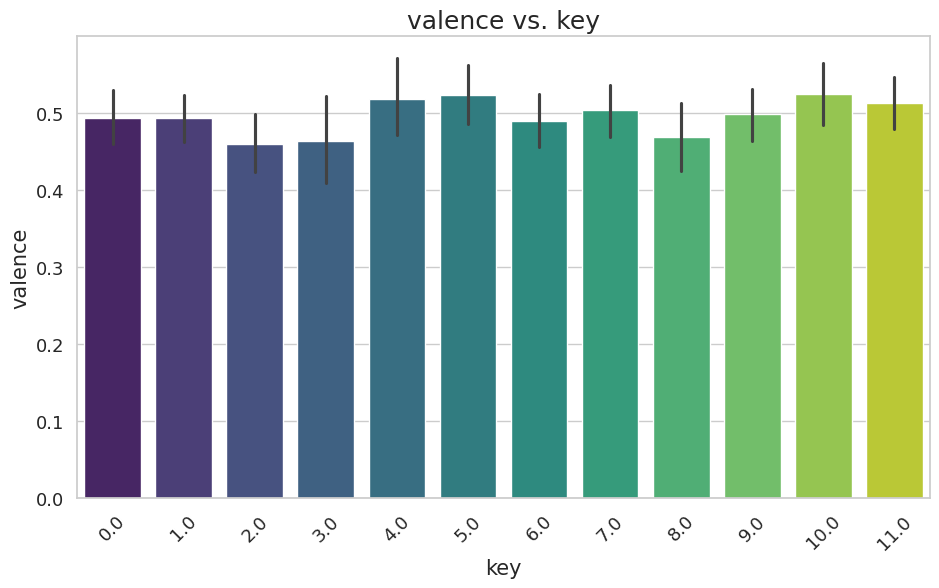

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


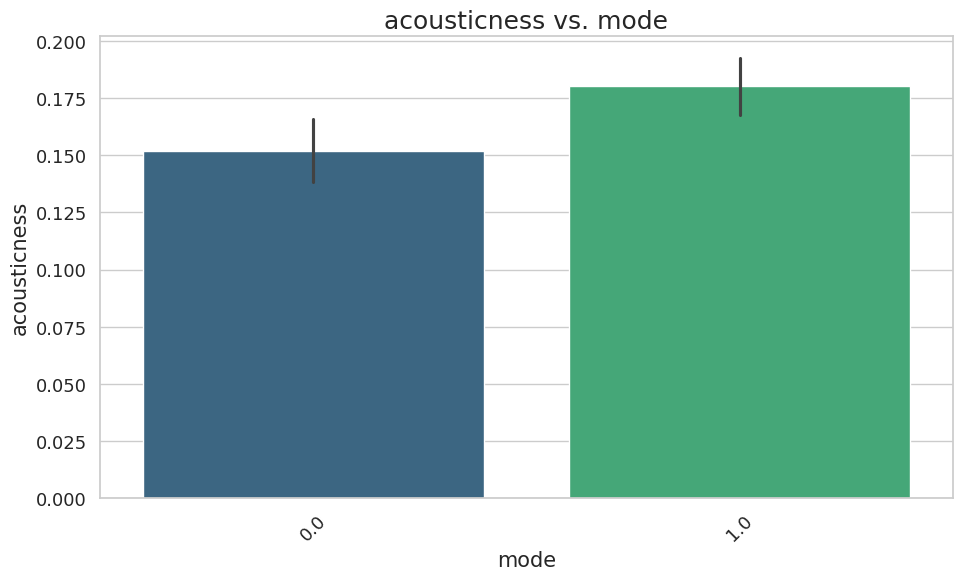

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


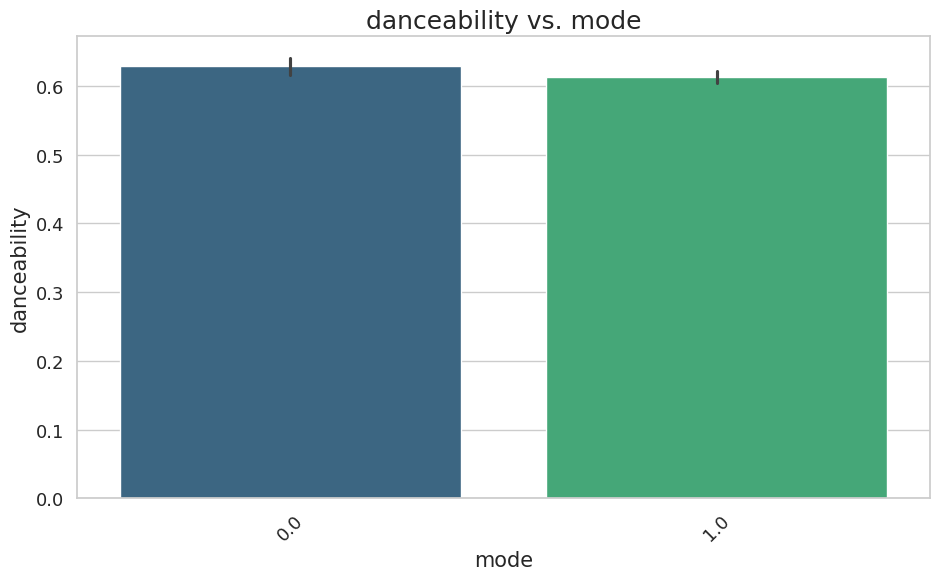

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


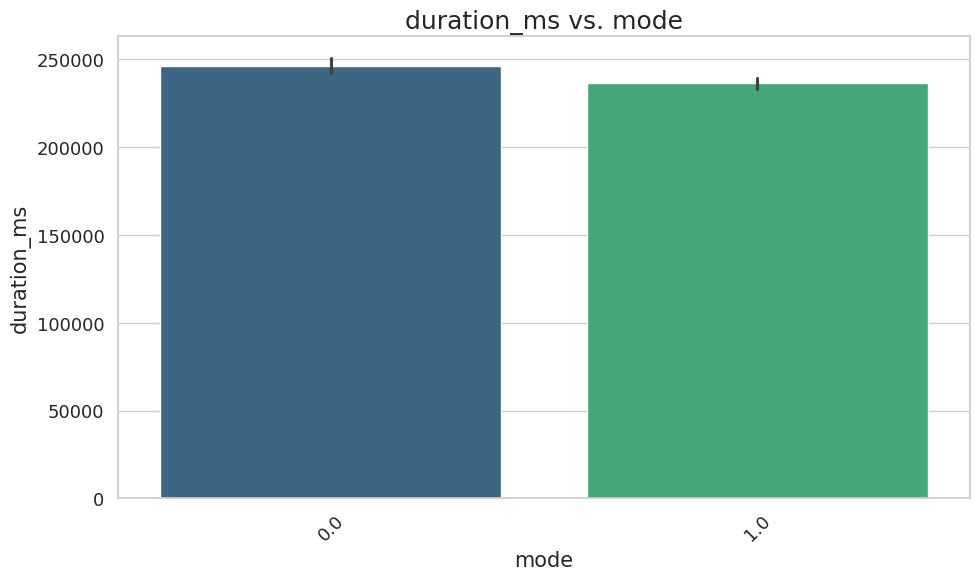

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


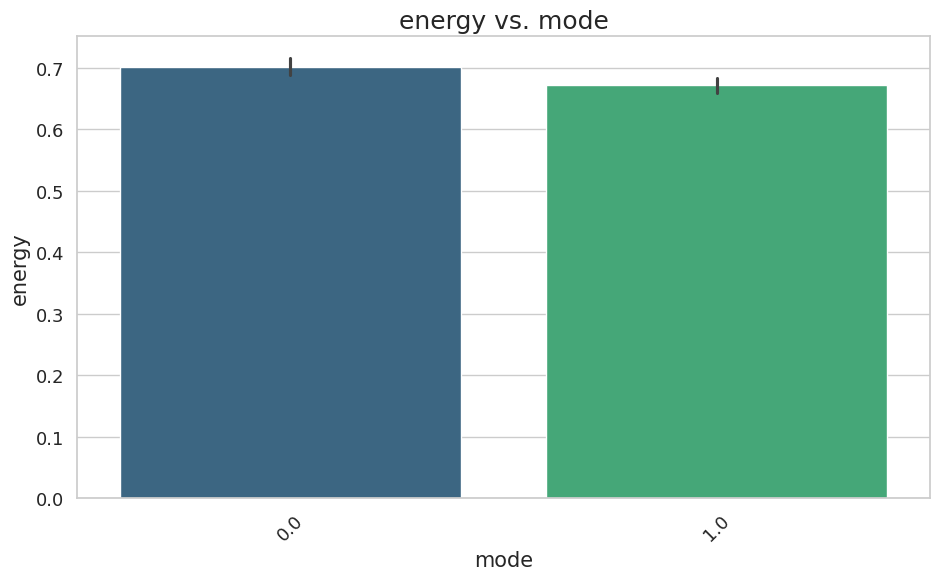

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


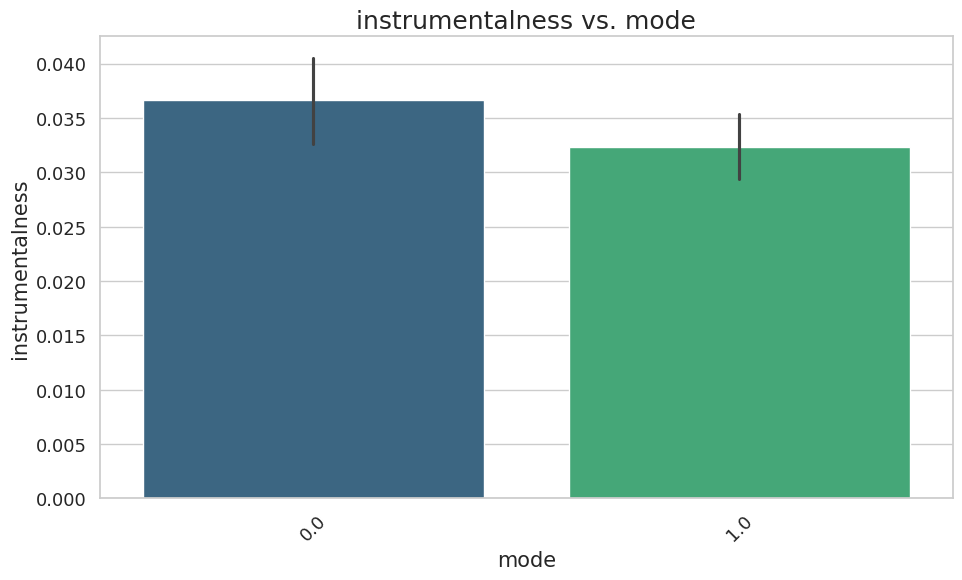

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


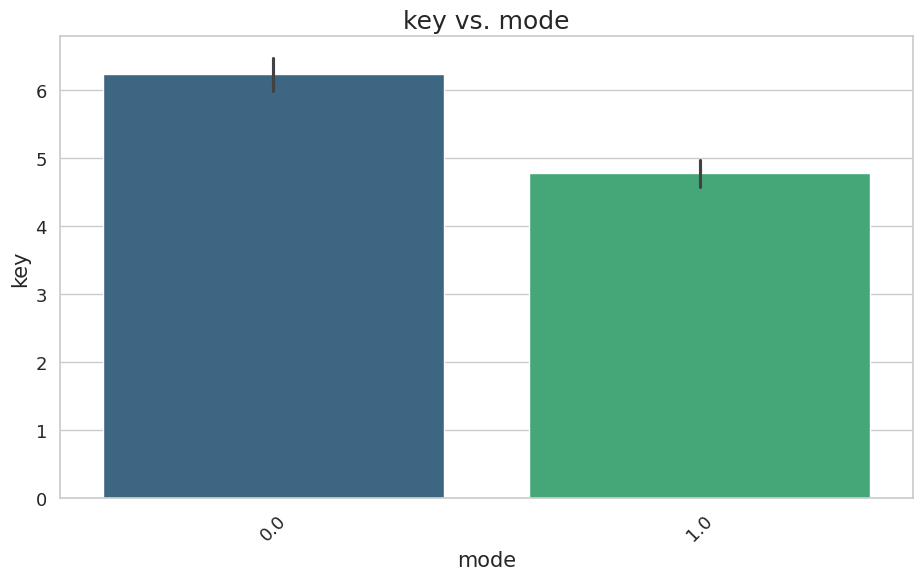

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


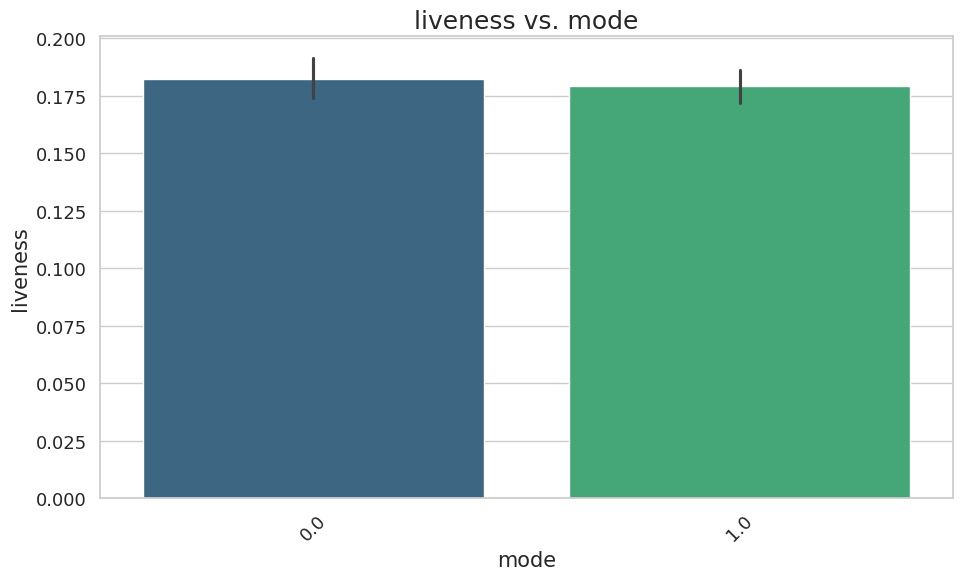

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


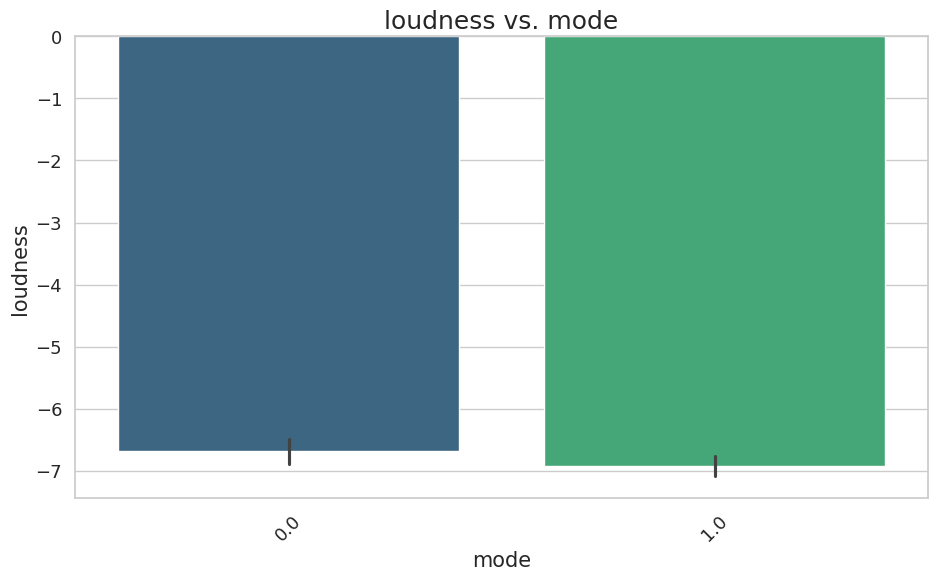

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


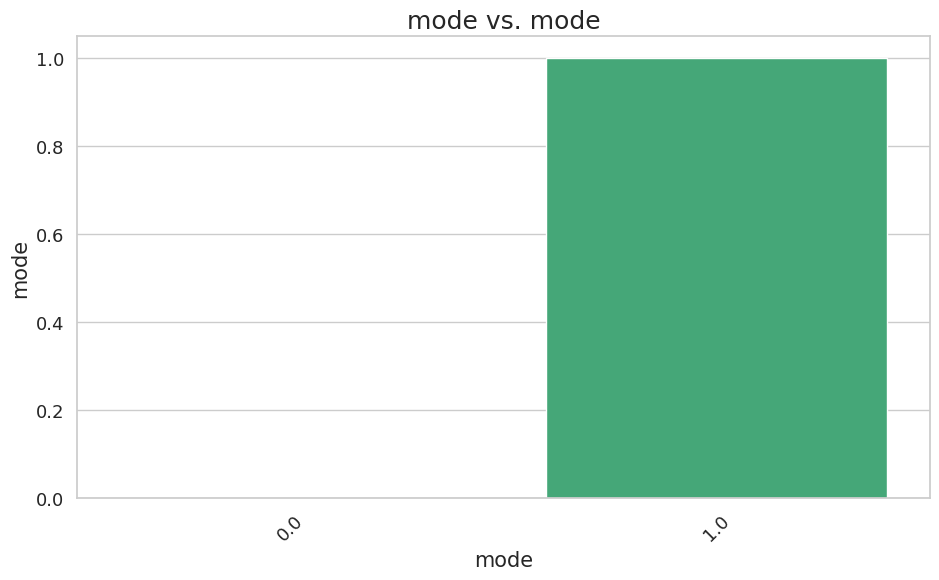

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


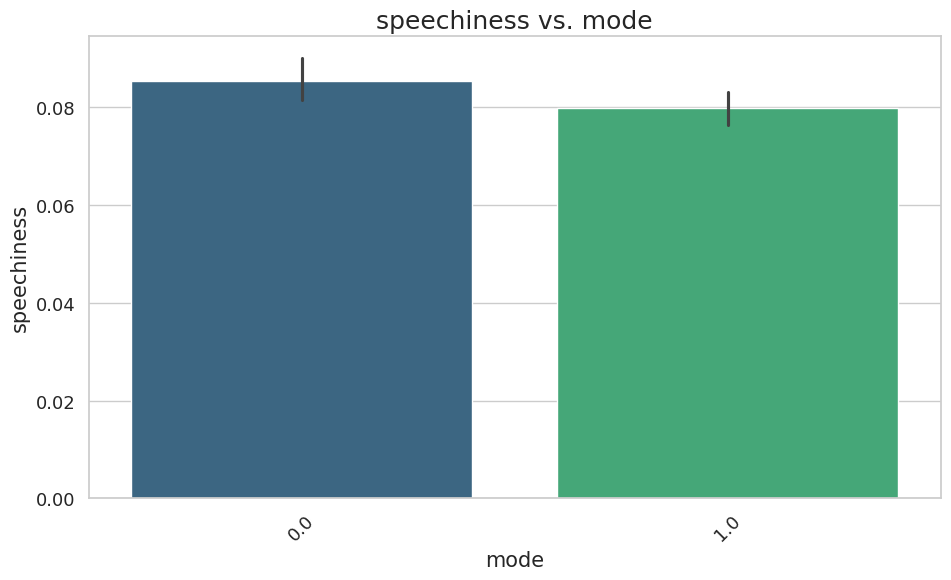

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


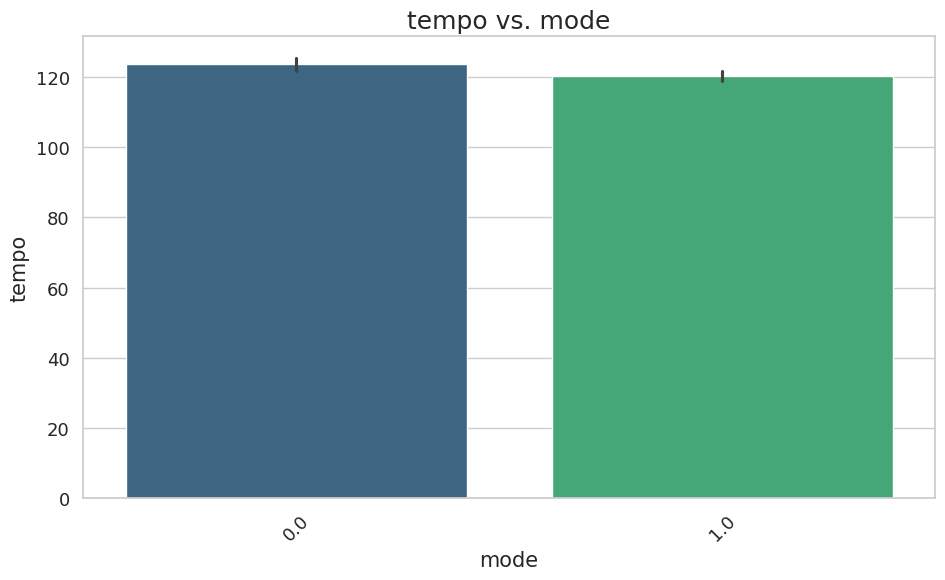

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


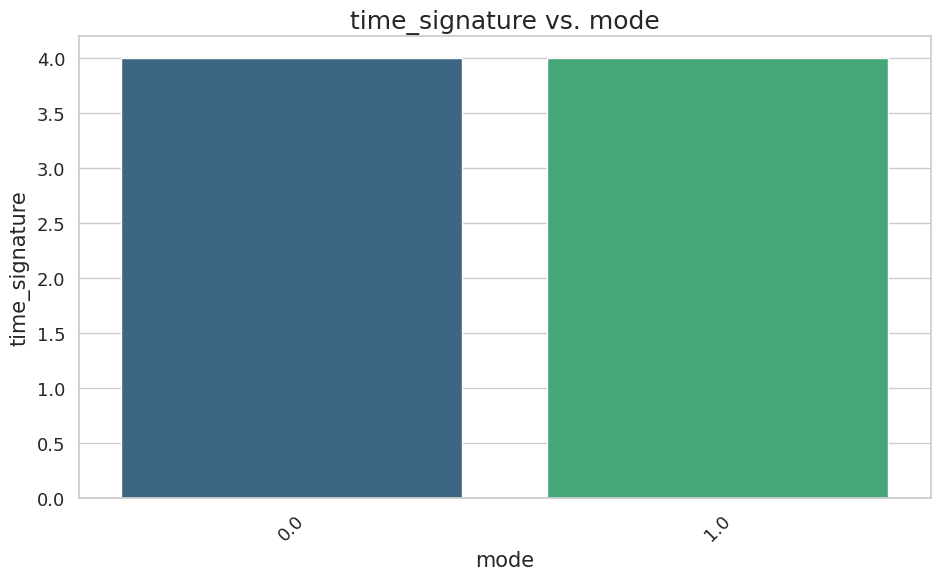

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


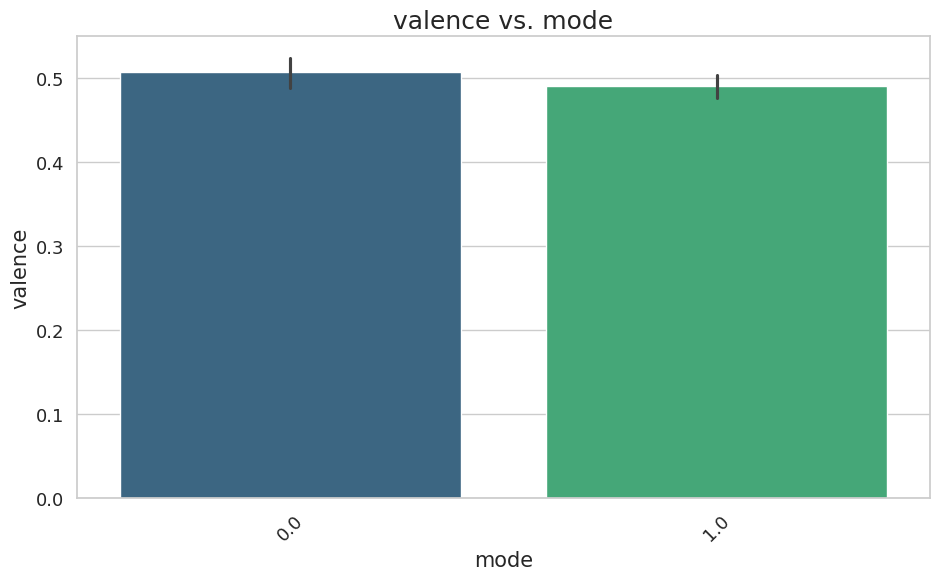

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


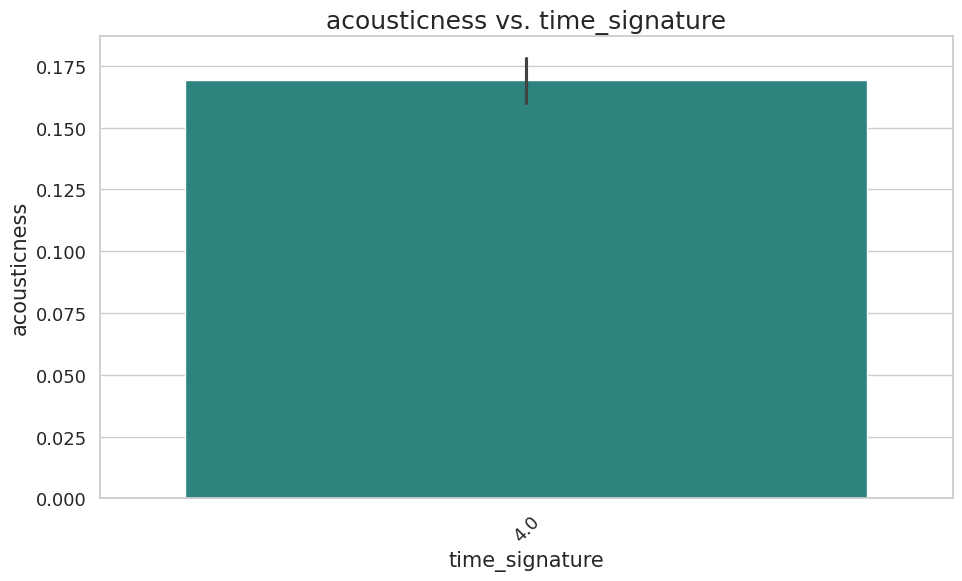

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


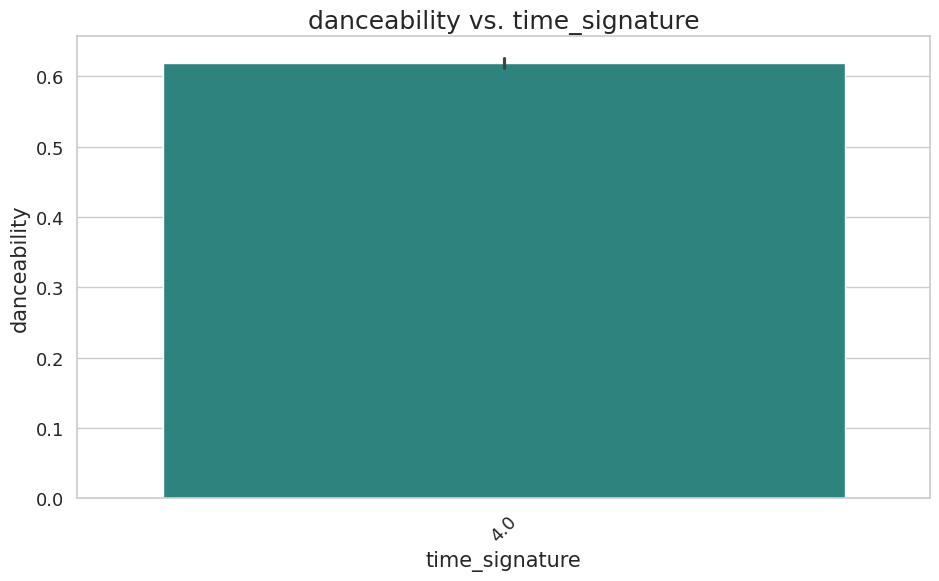

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


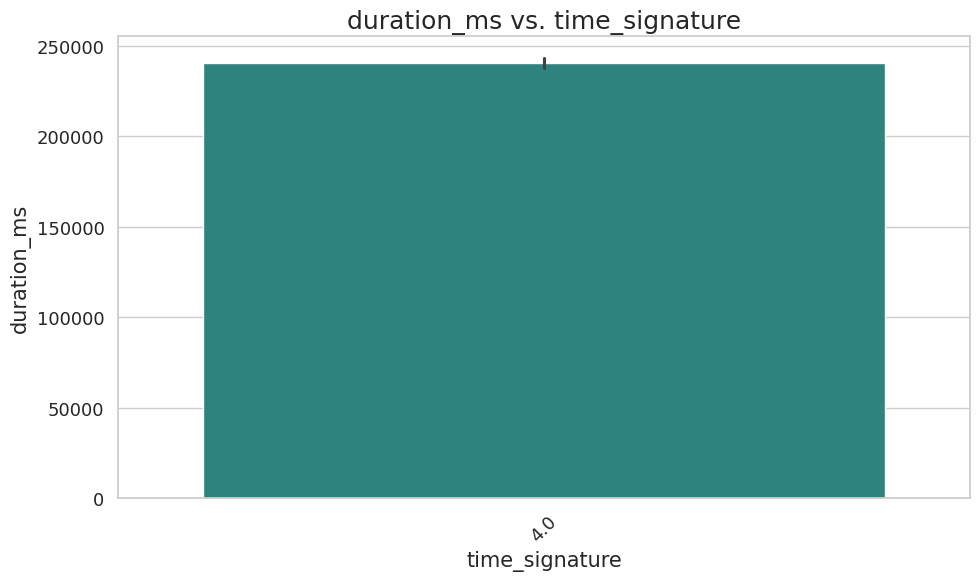

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


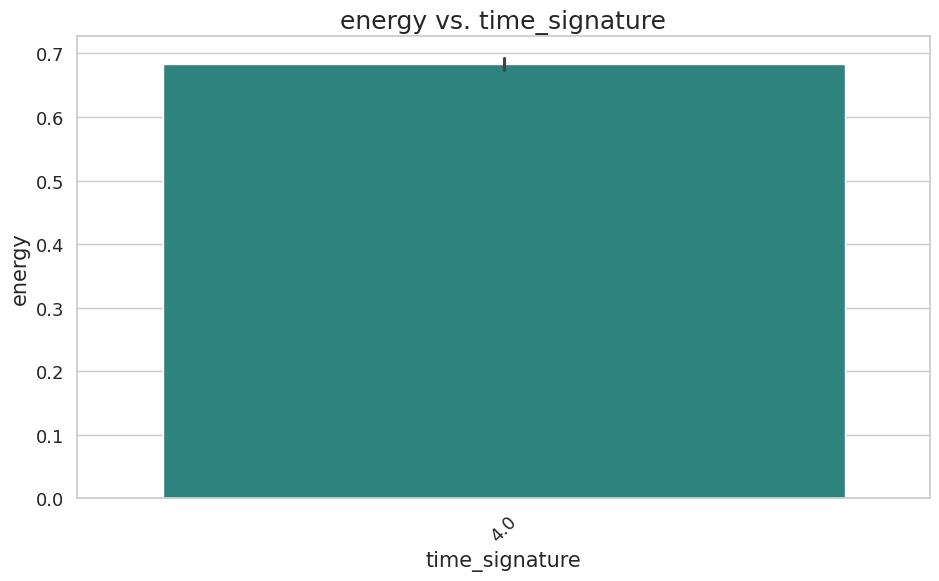

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


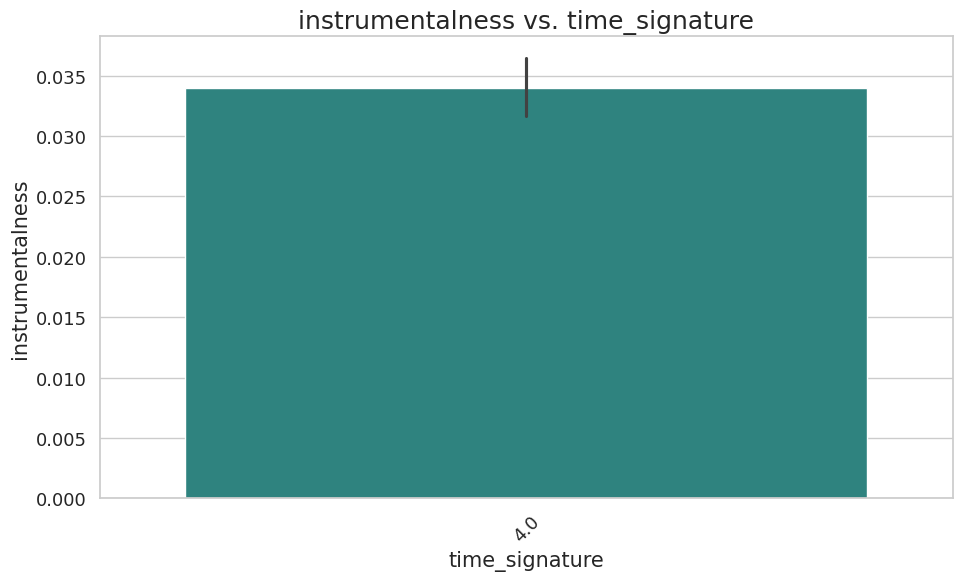

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


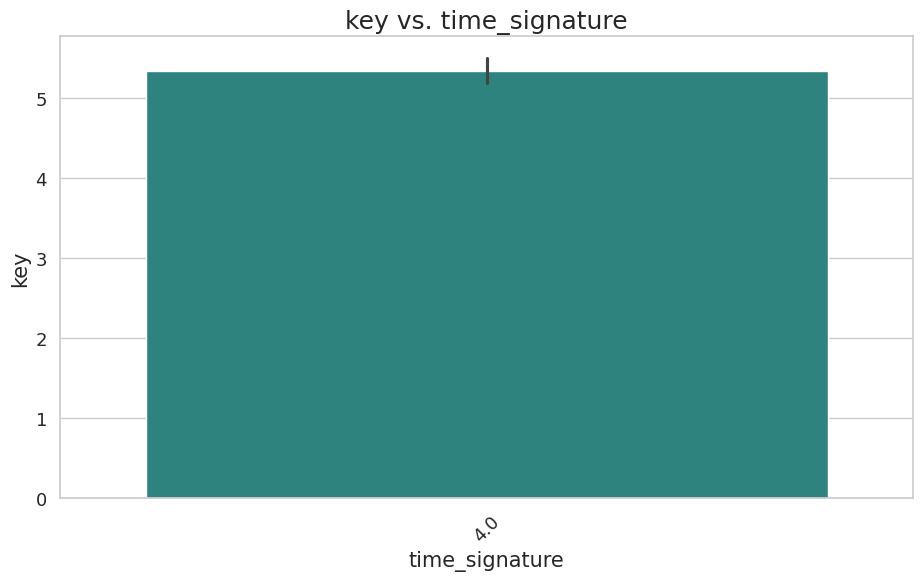

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


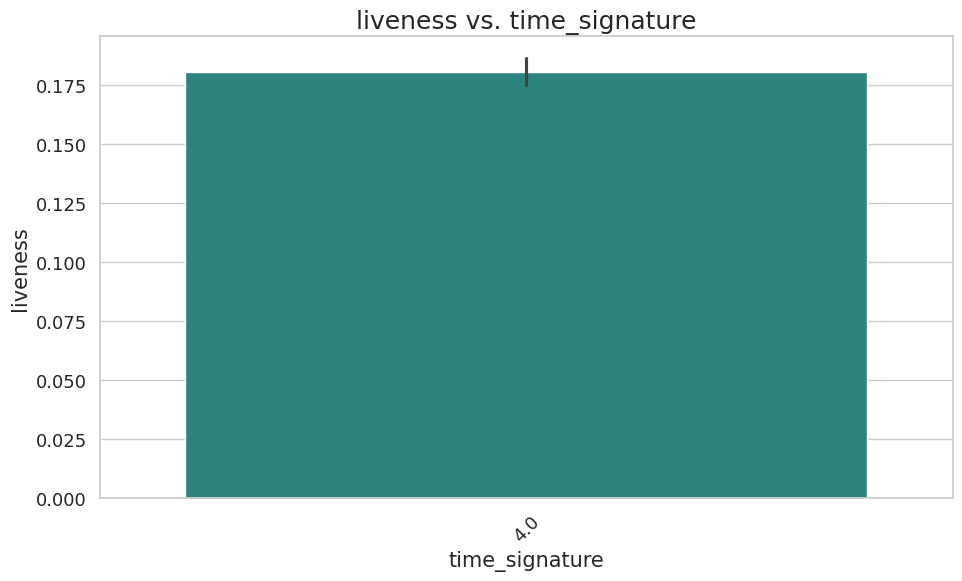

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


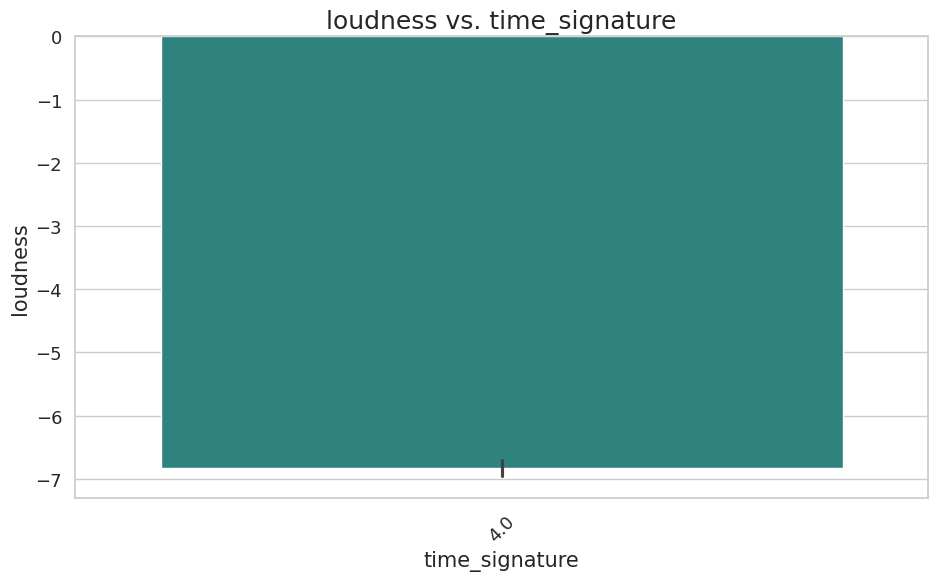

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


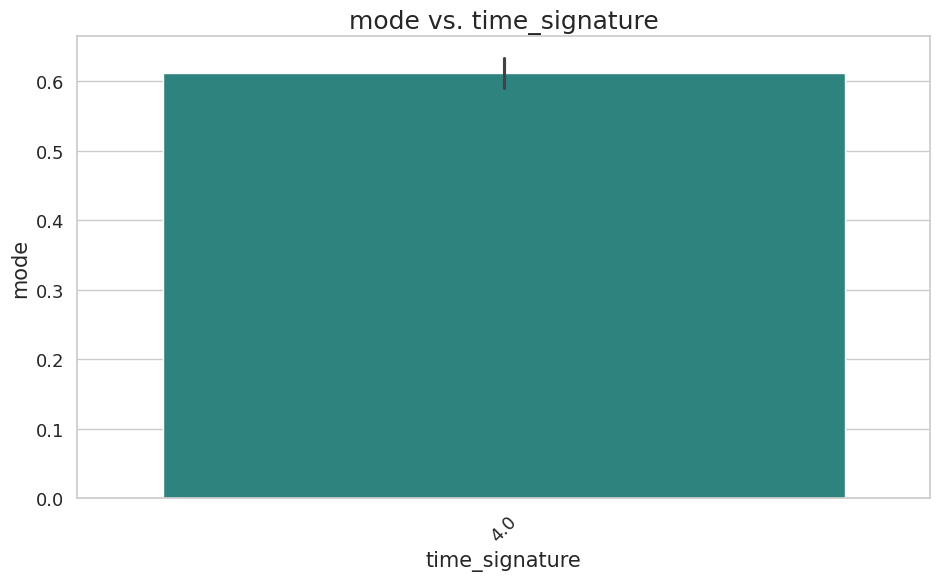

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


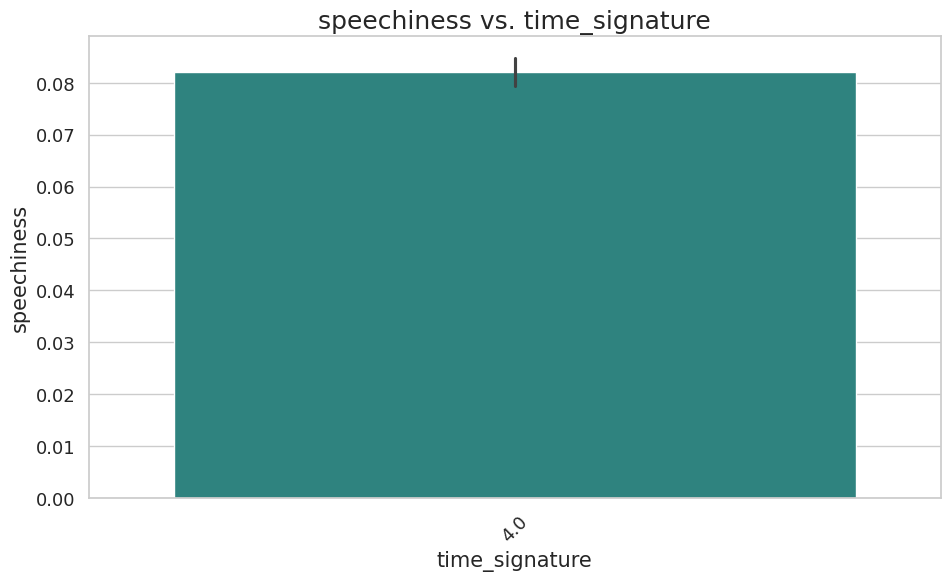

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


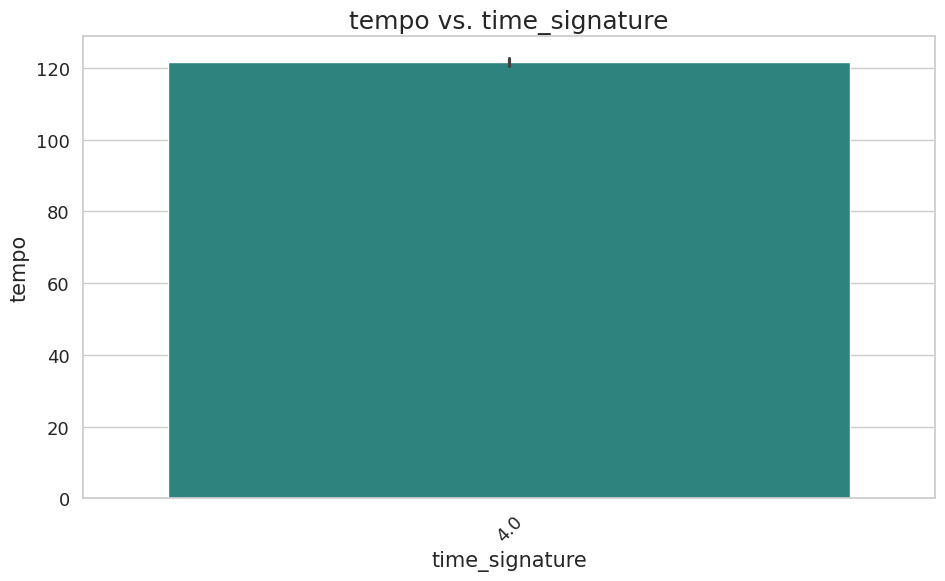

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


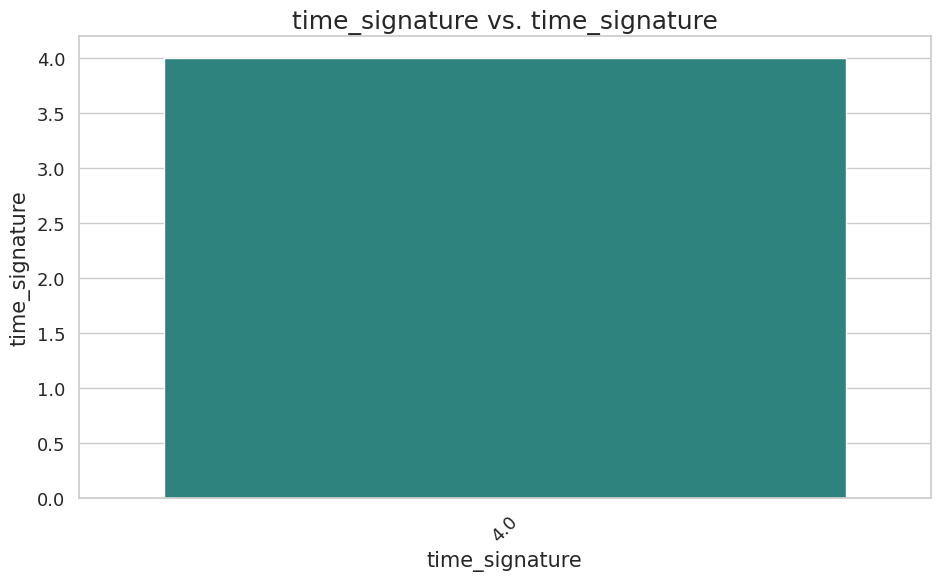

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


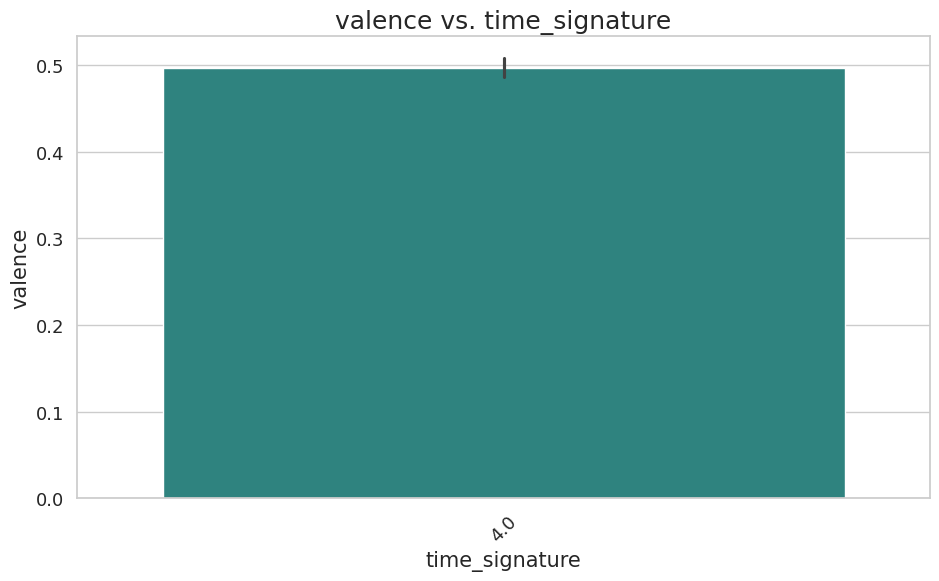

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


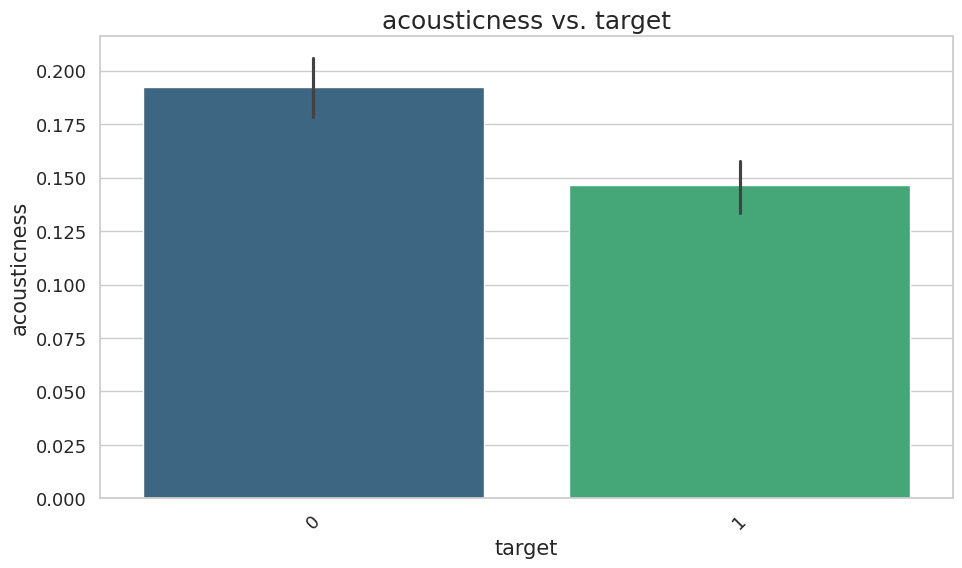

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


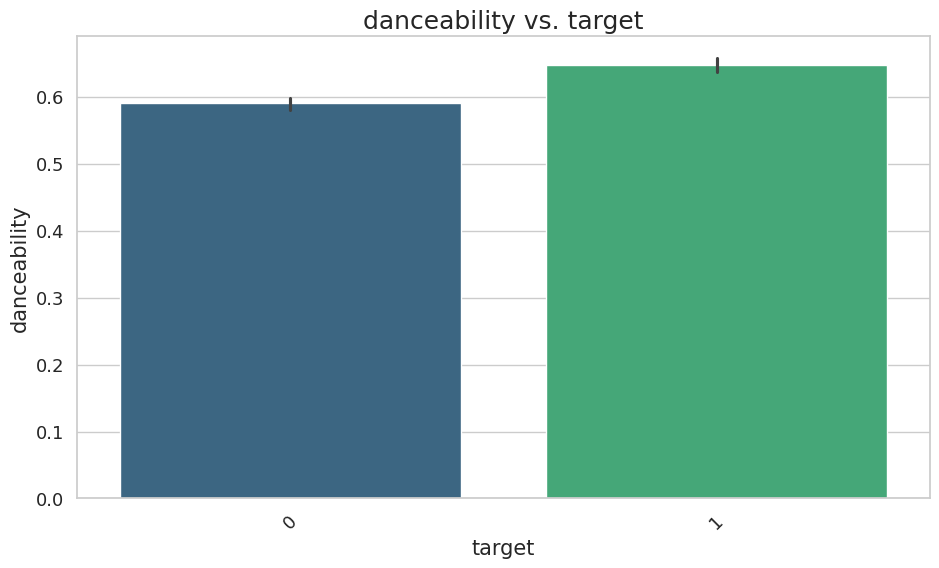

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


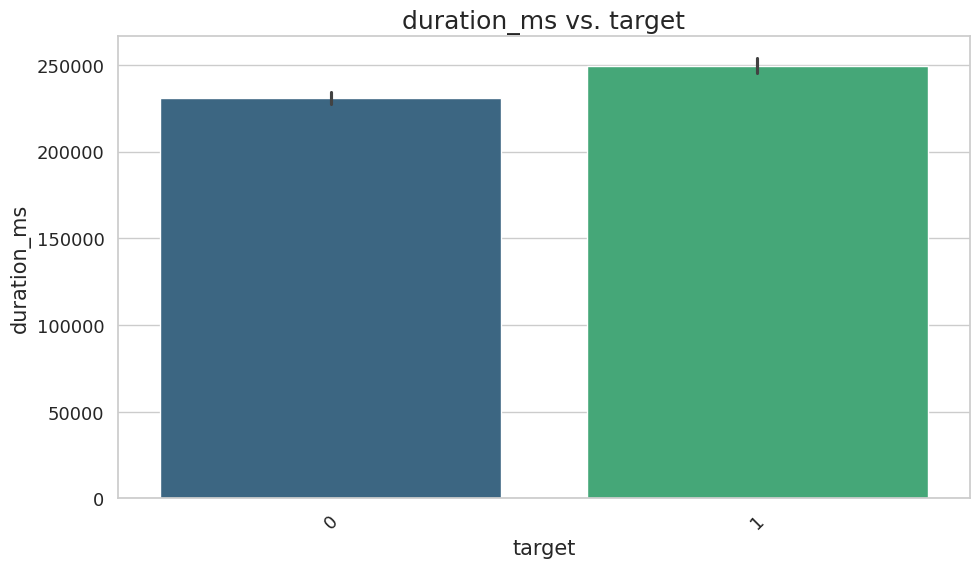

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


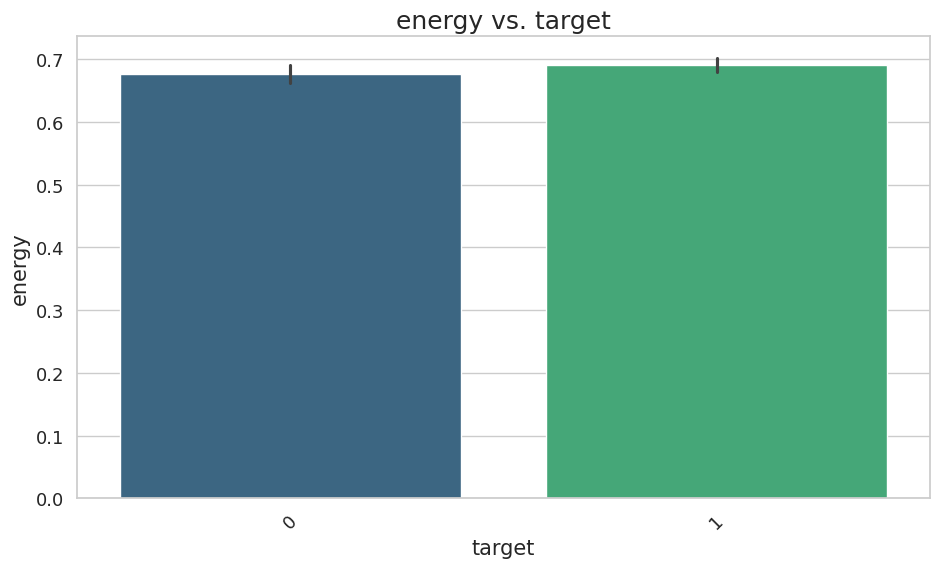

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


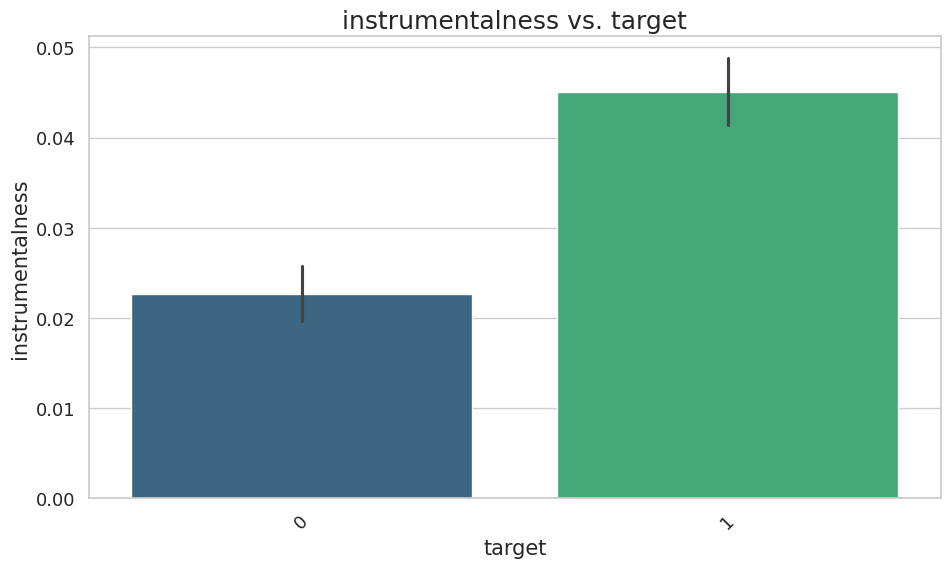

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


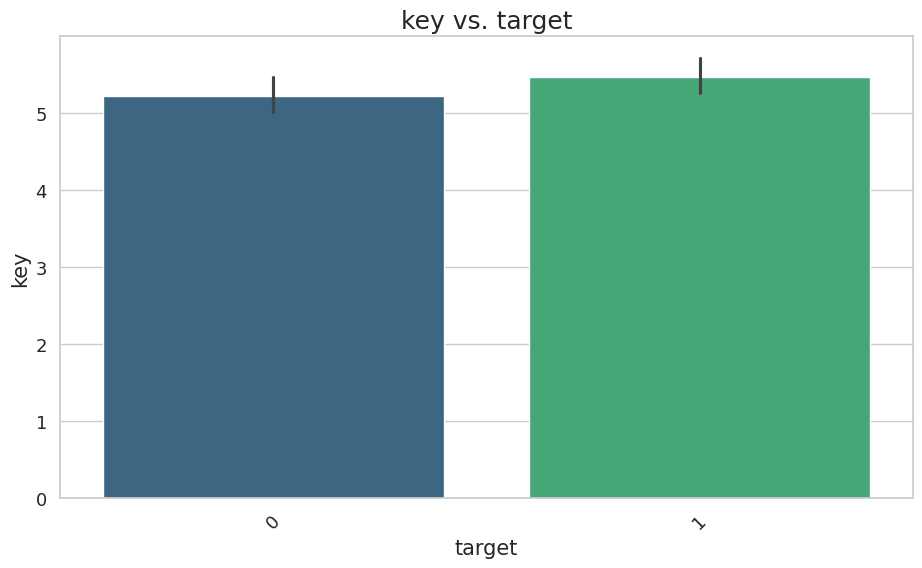

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


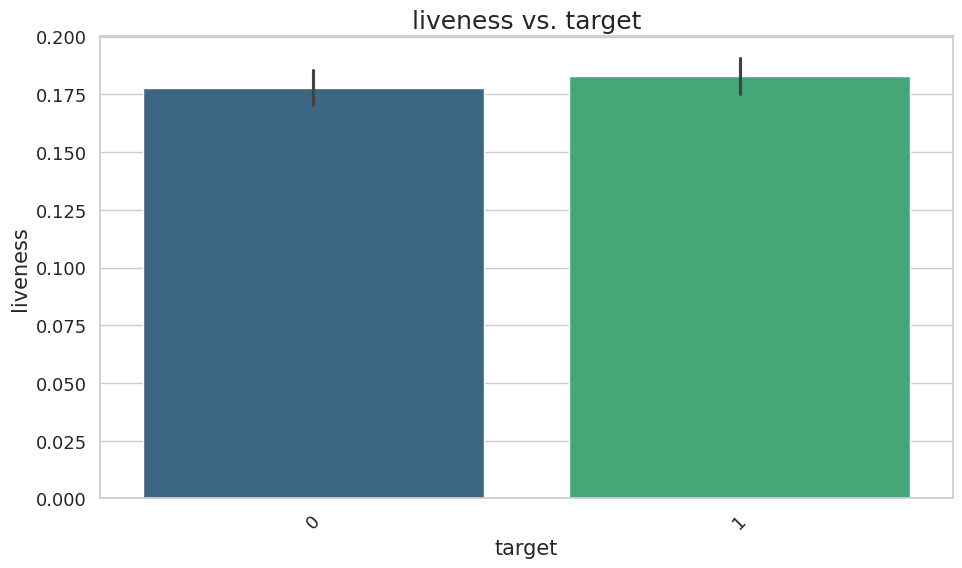

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


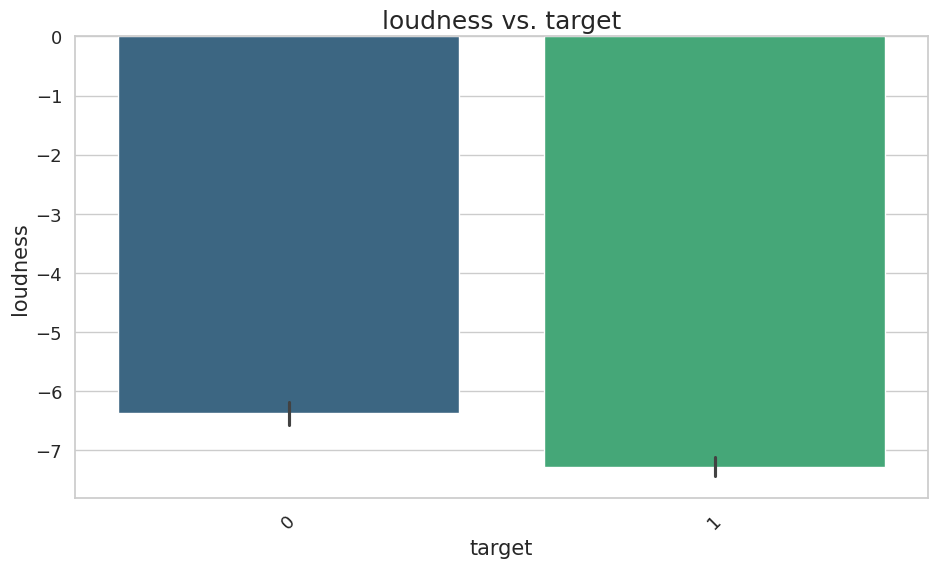

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


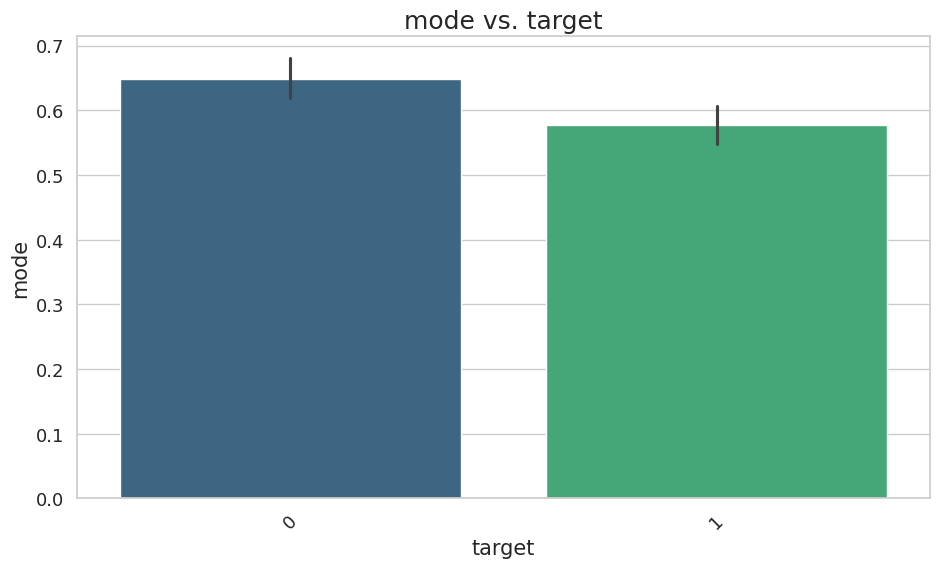

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


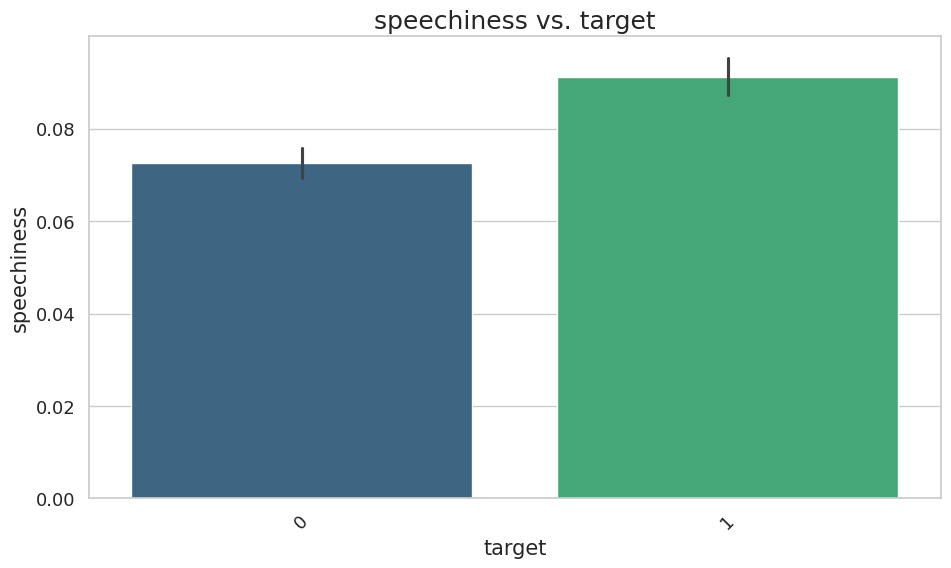

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


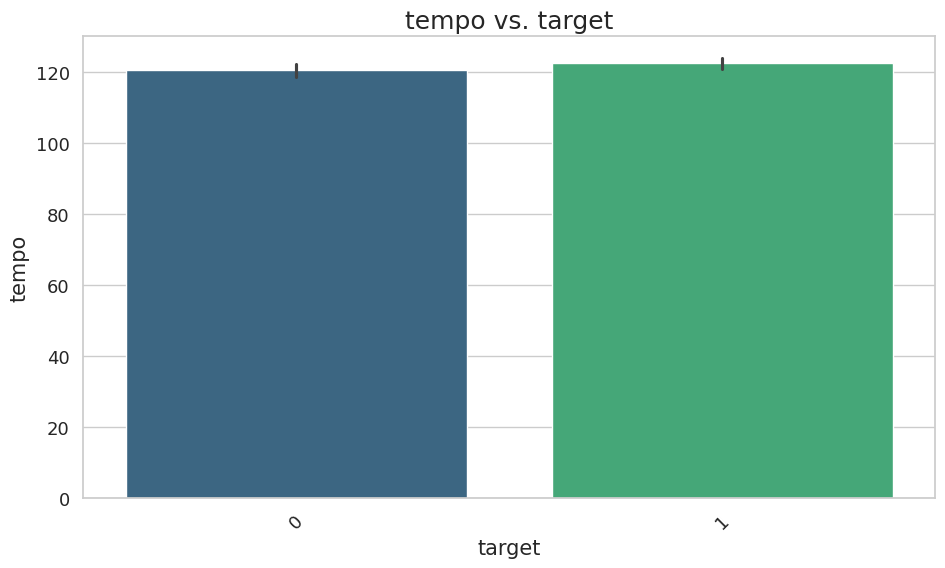

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


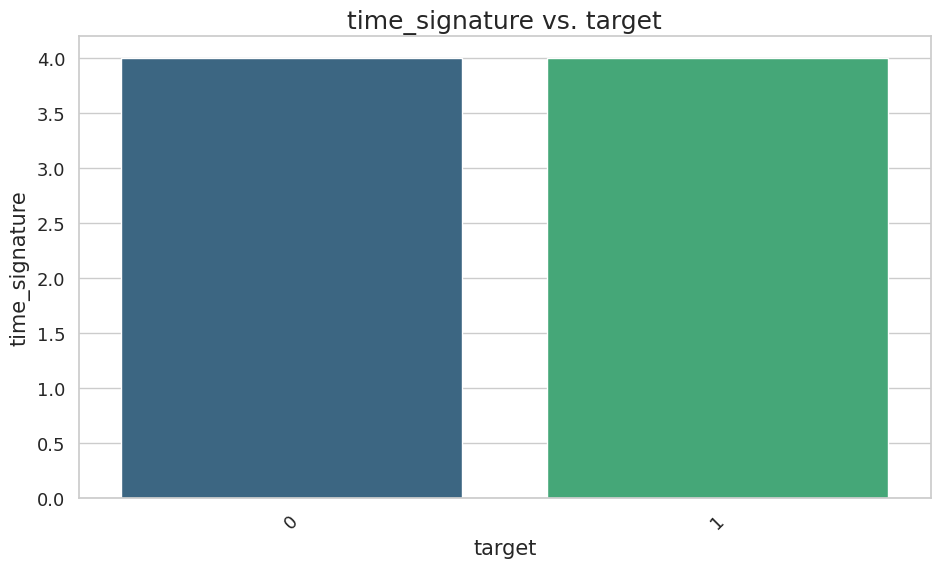

<ipython-input-41-43cd4be9ea51>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')


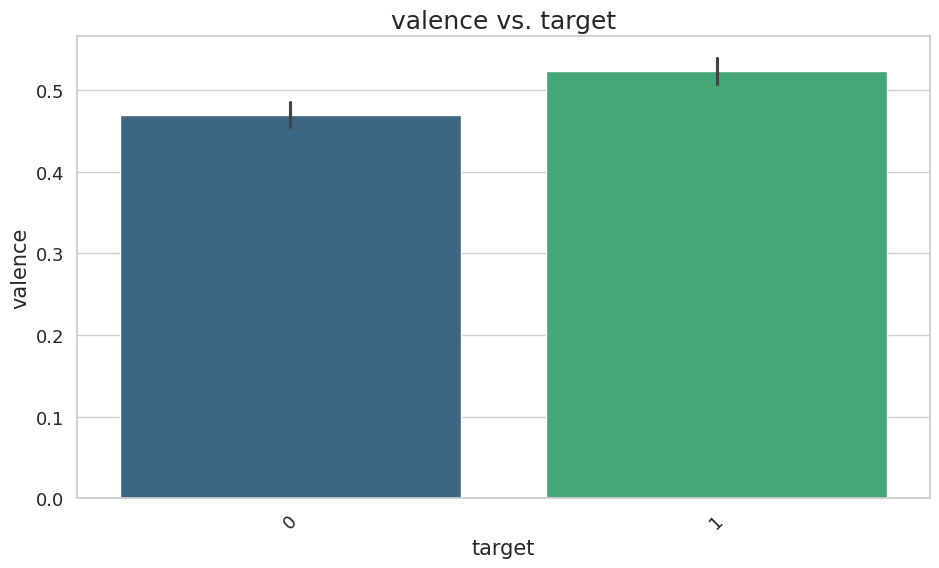

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


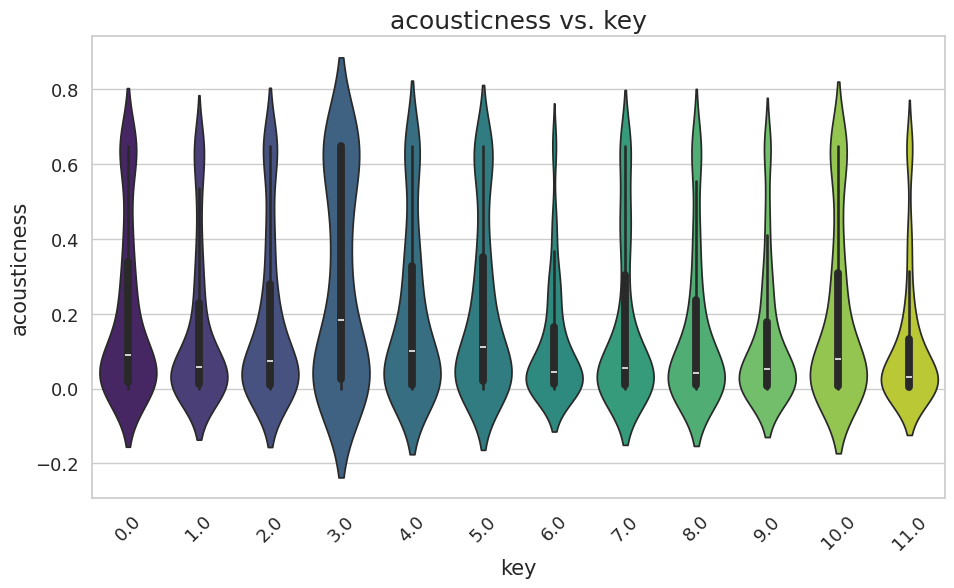

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


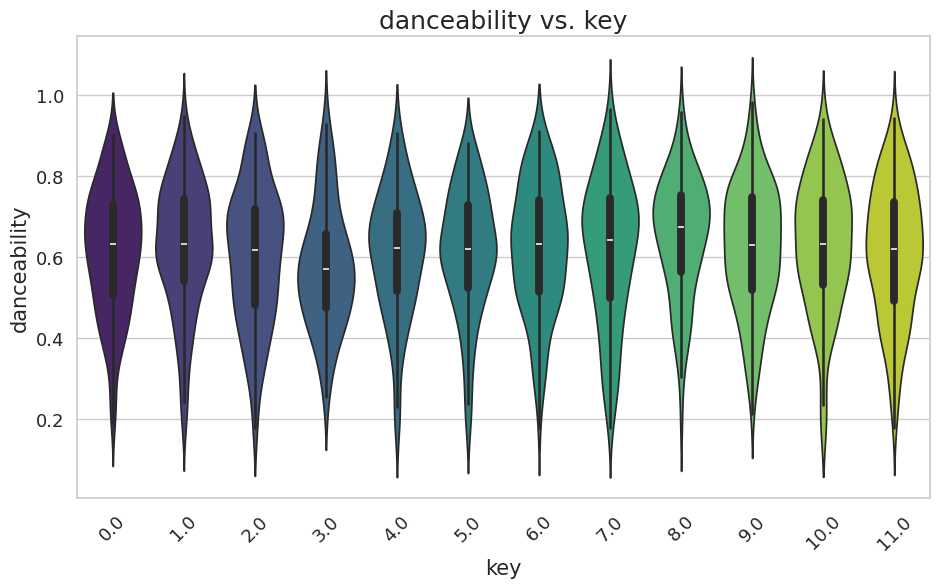

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


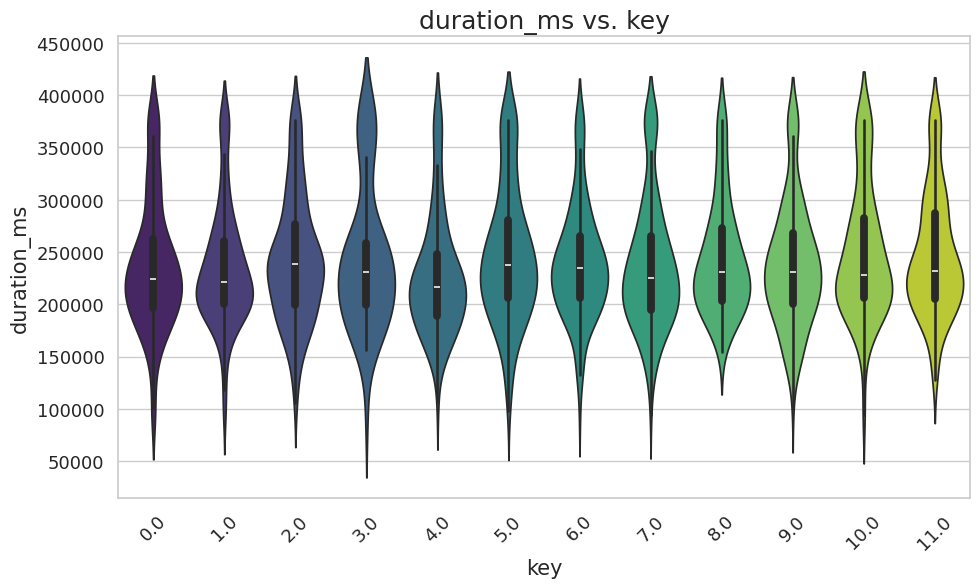

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


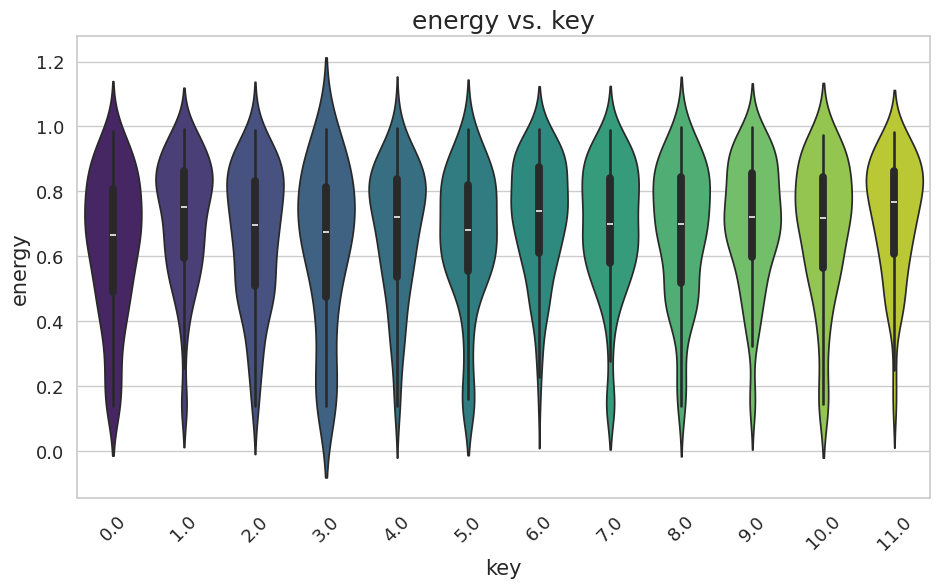

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


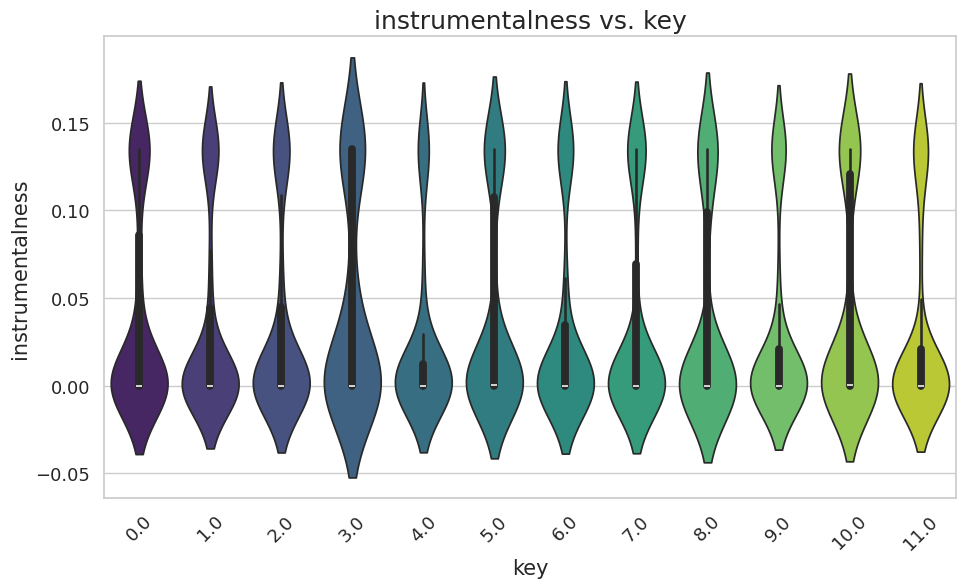

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


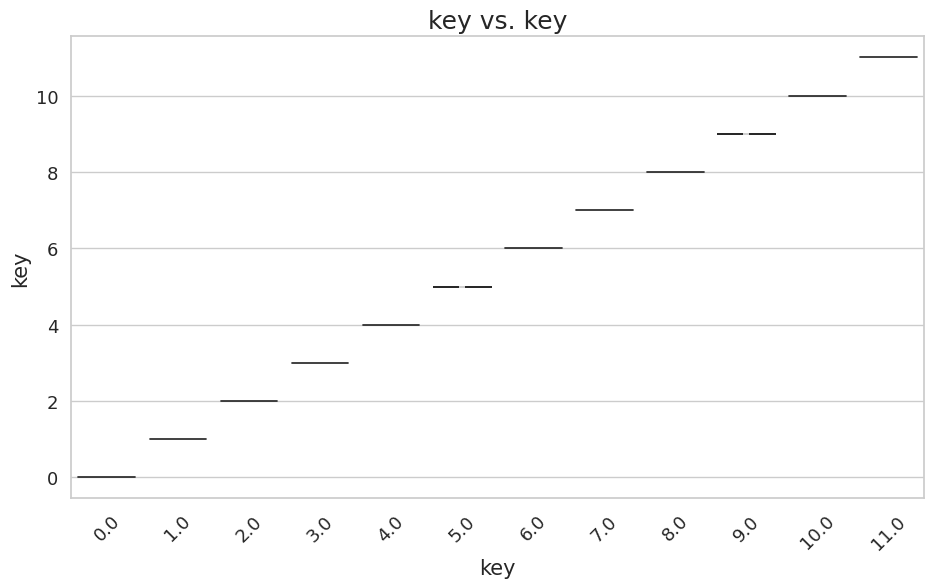

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


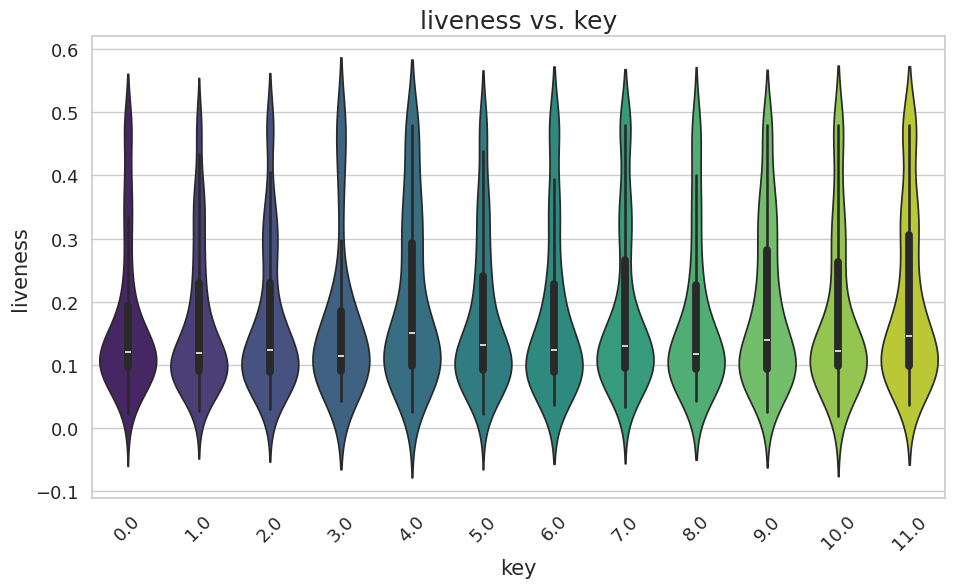

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


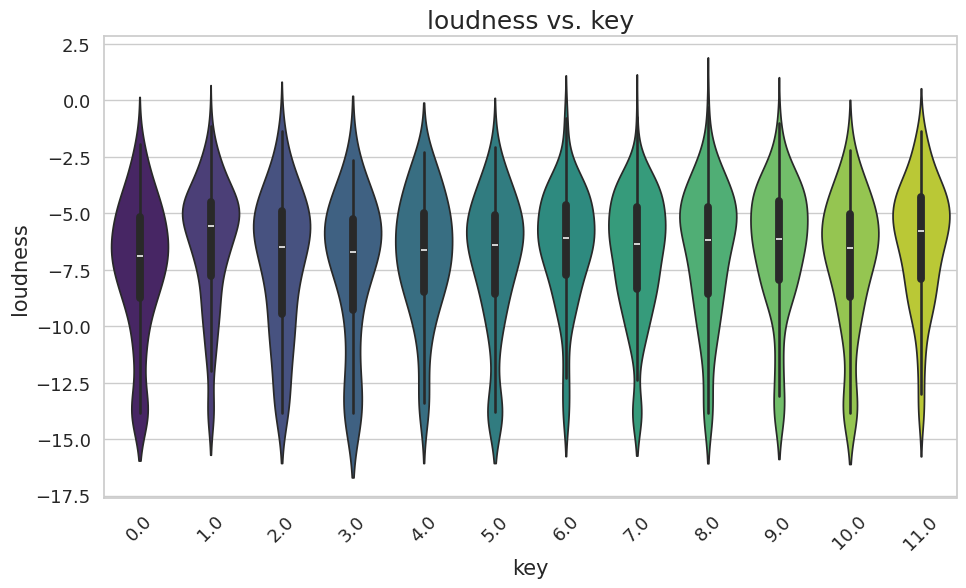

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


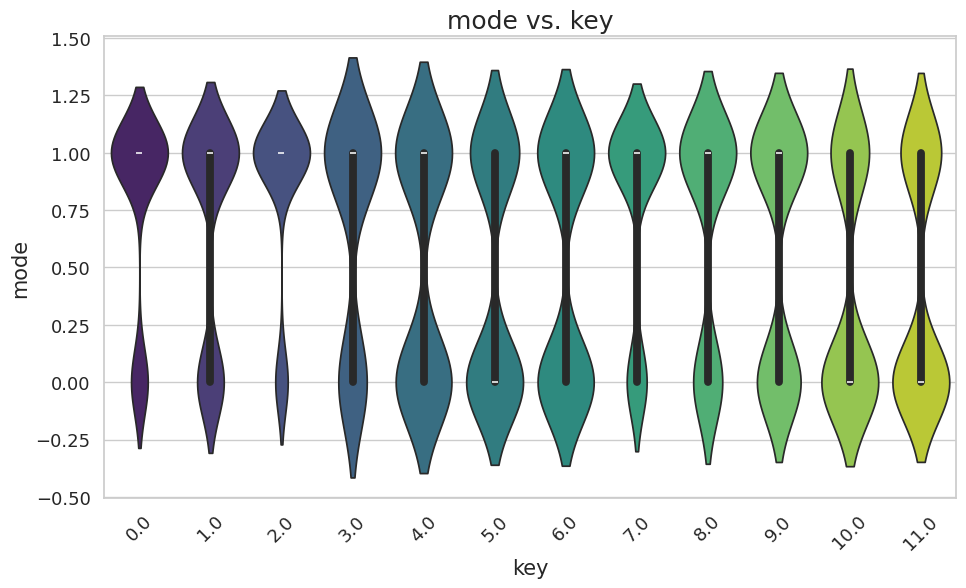

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


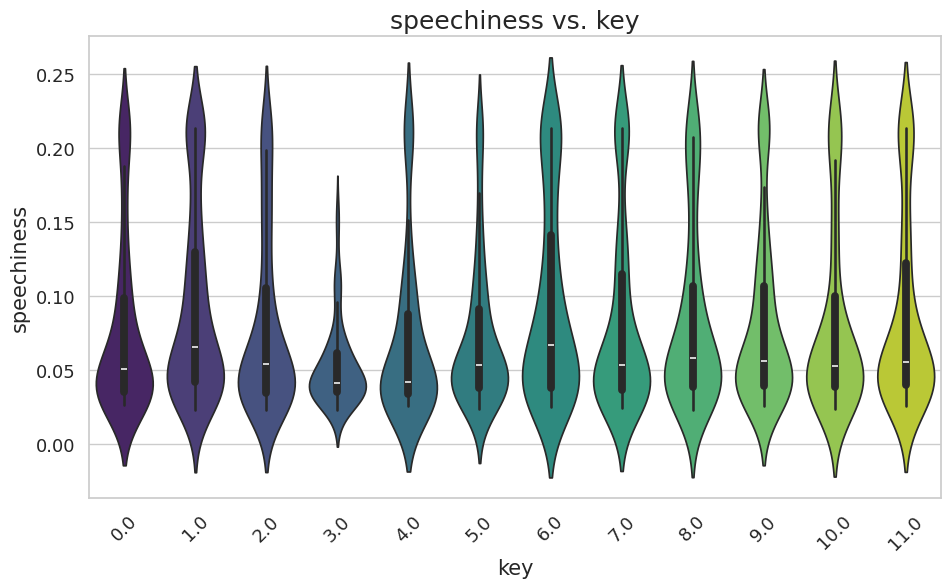

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


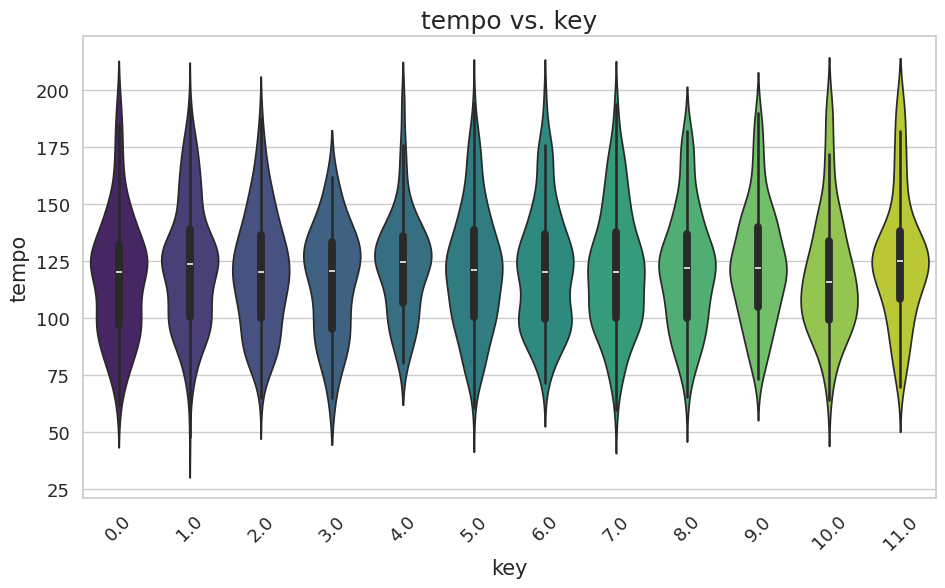

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


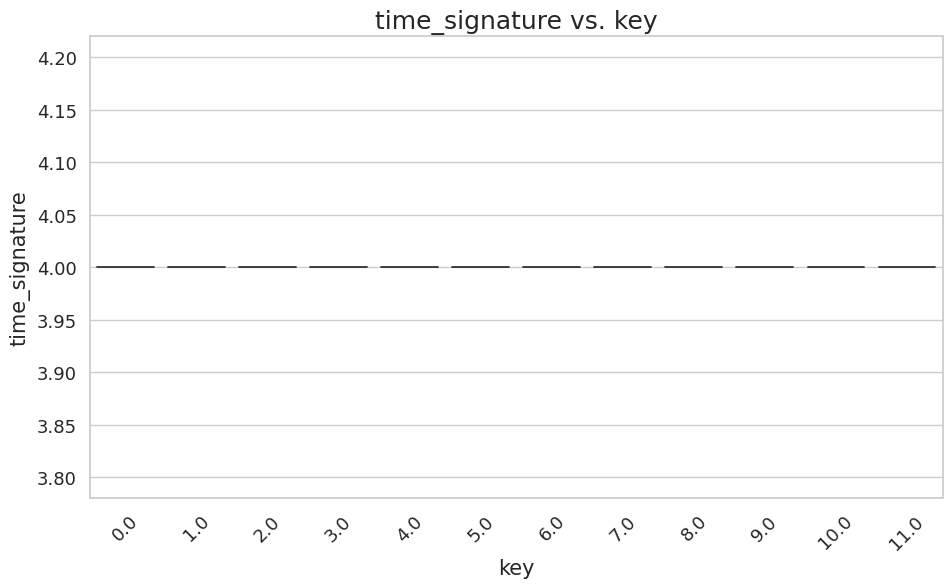

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


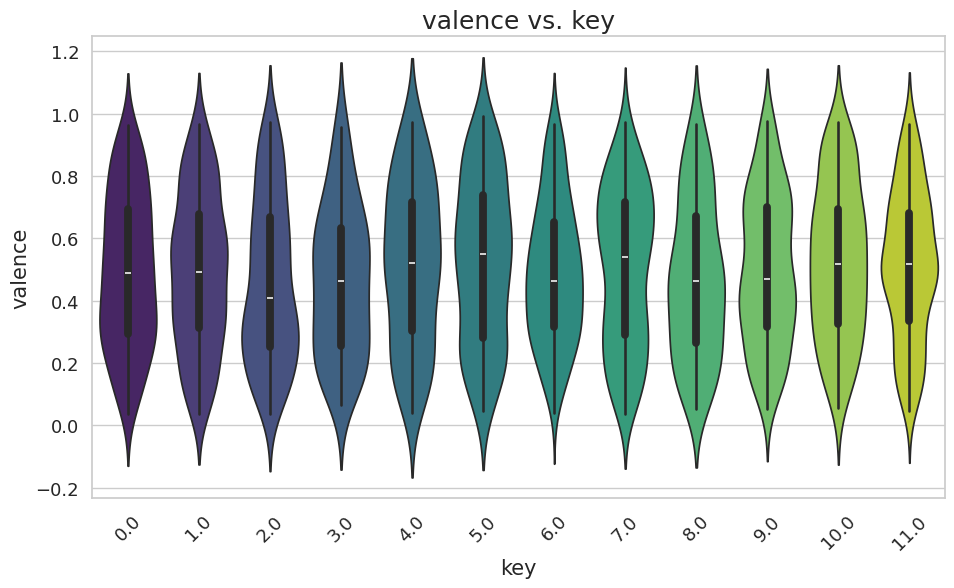

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


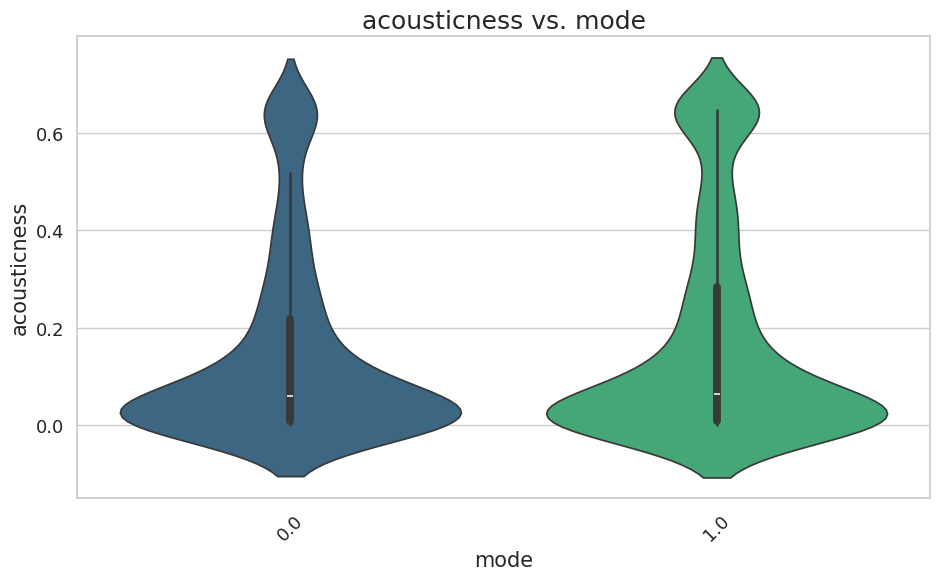

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


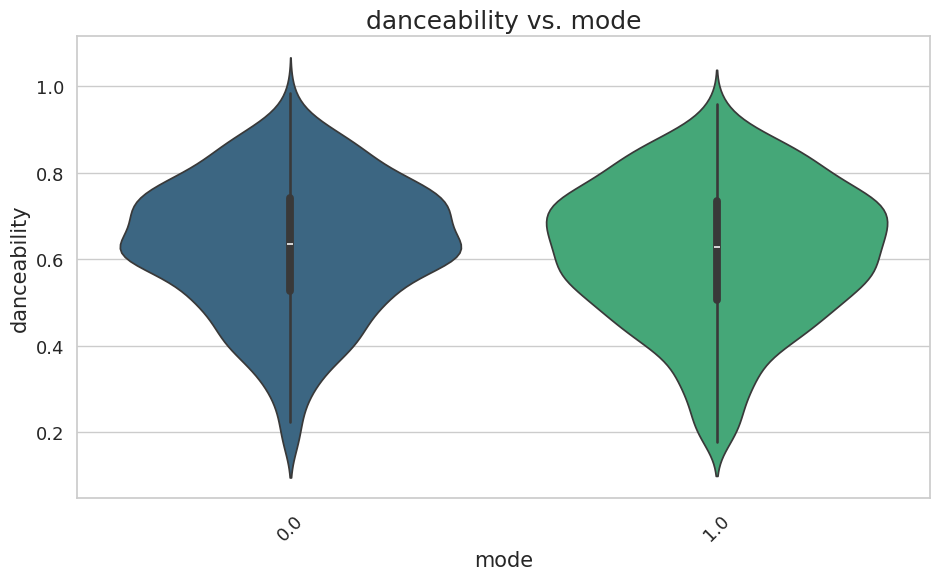

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


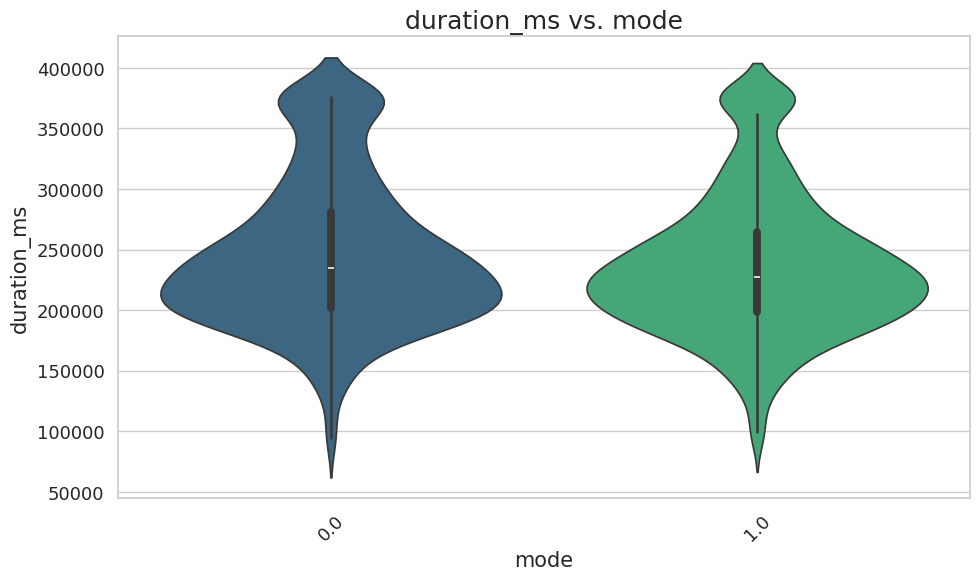

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


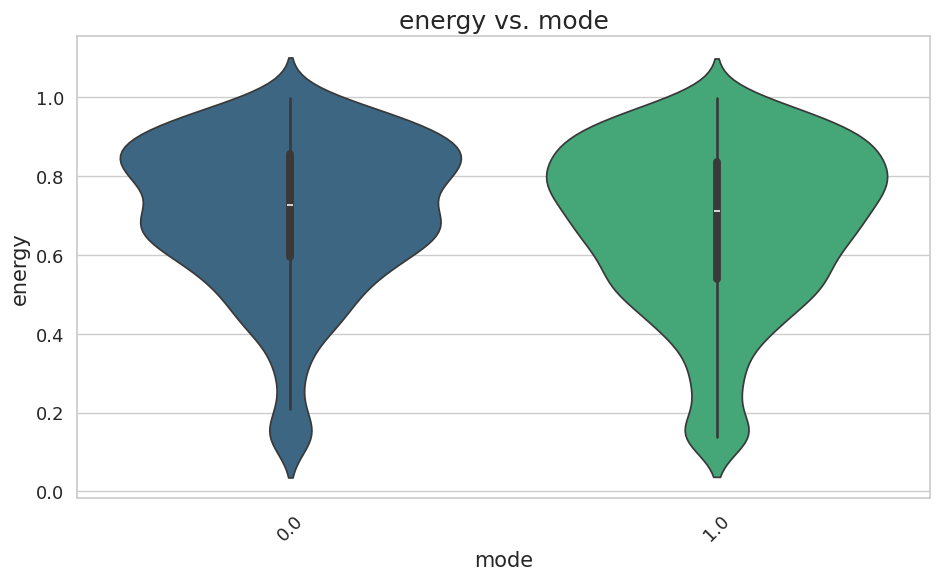

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


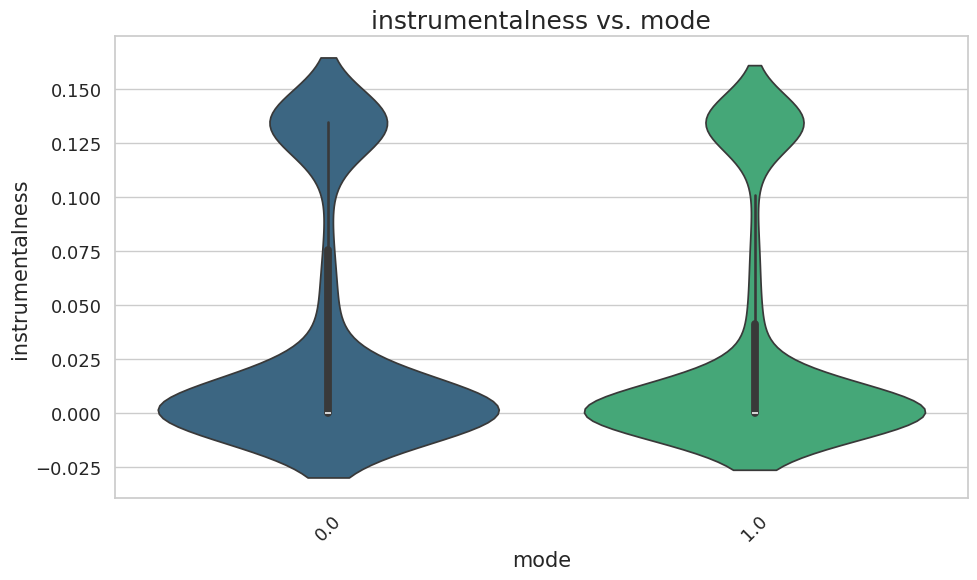

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


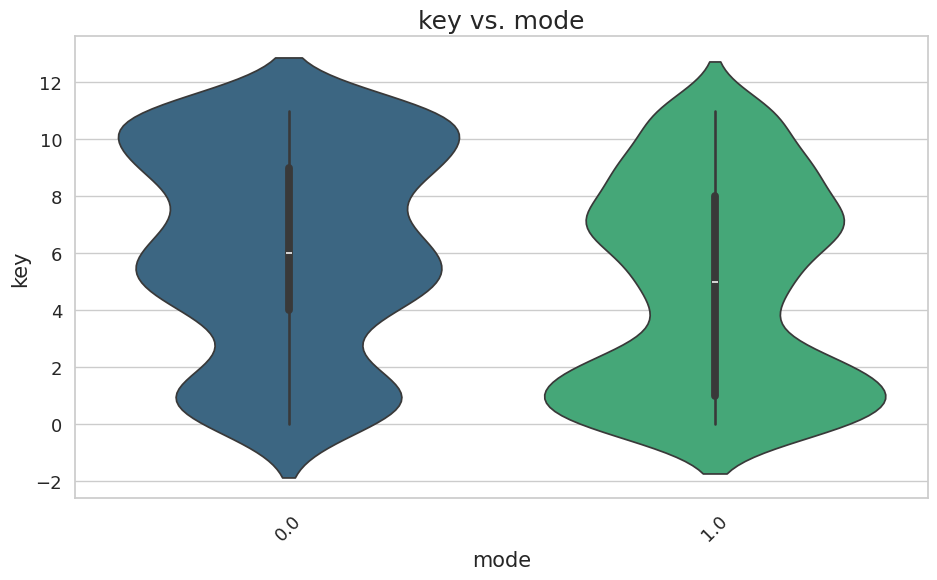

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


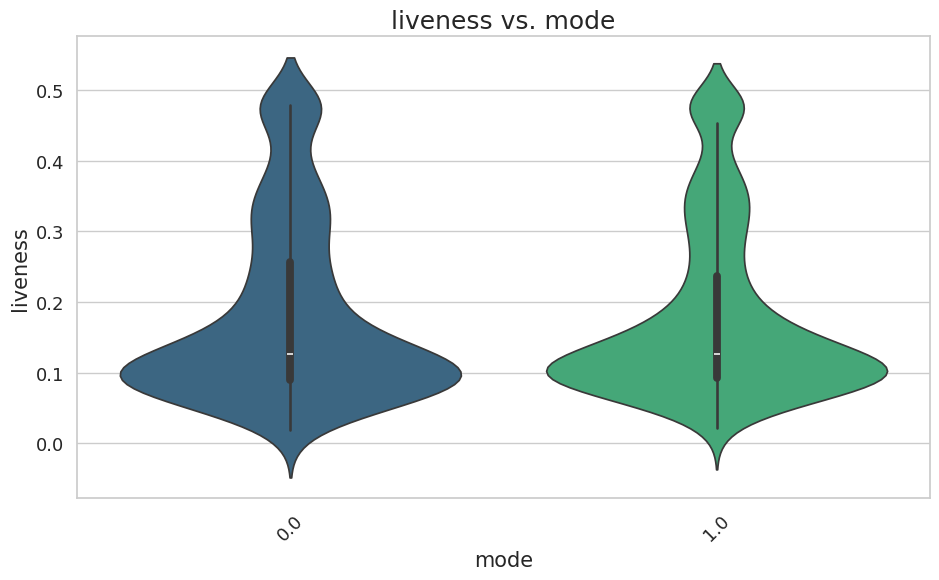

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


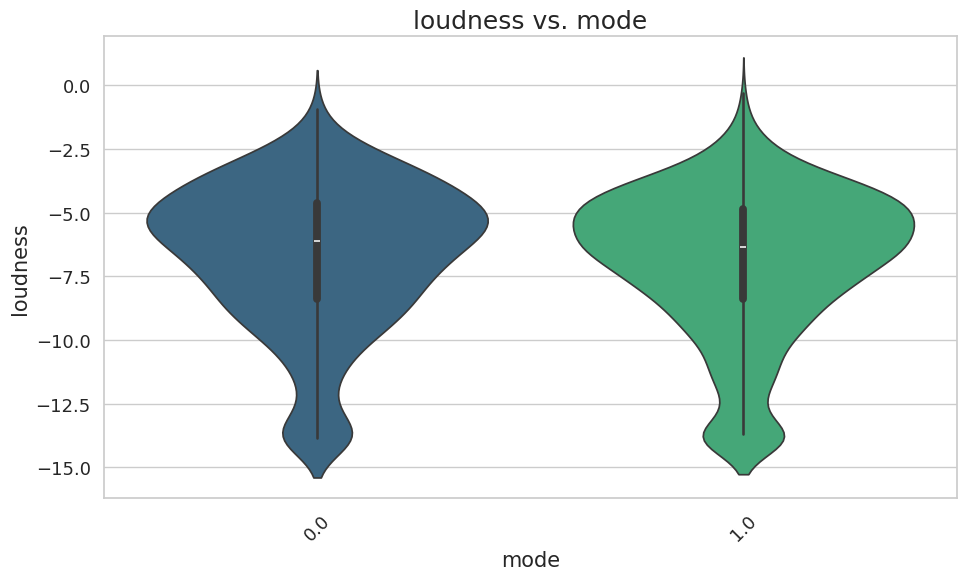

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


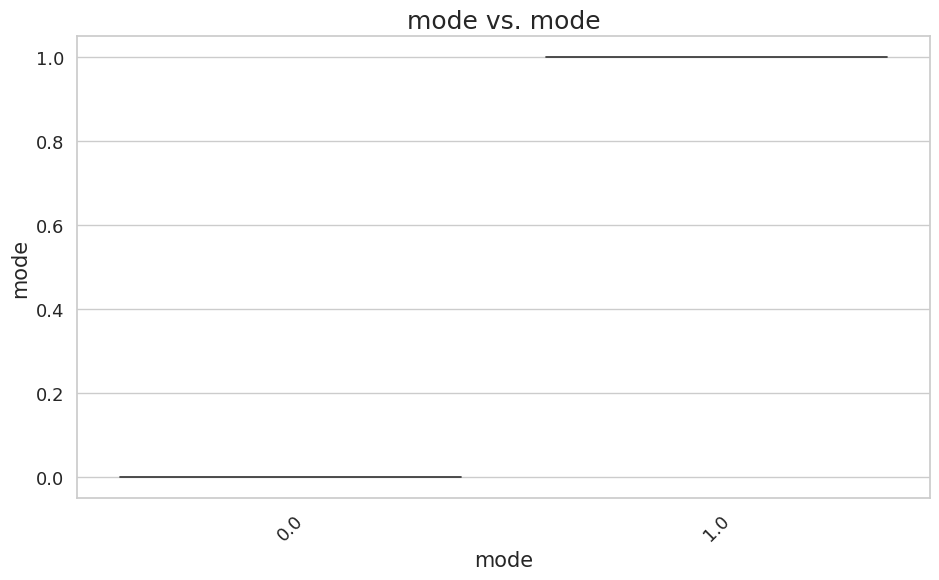

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


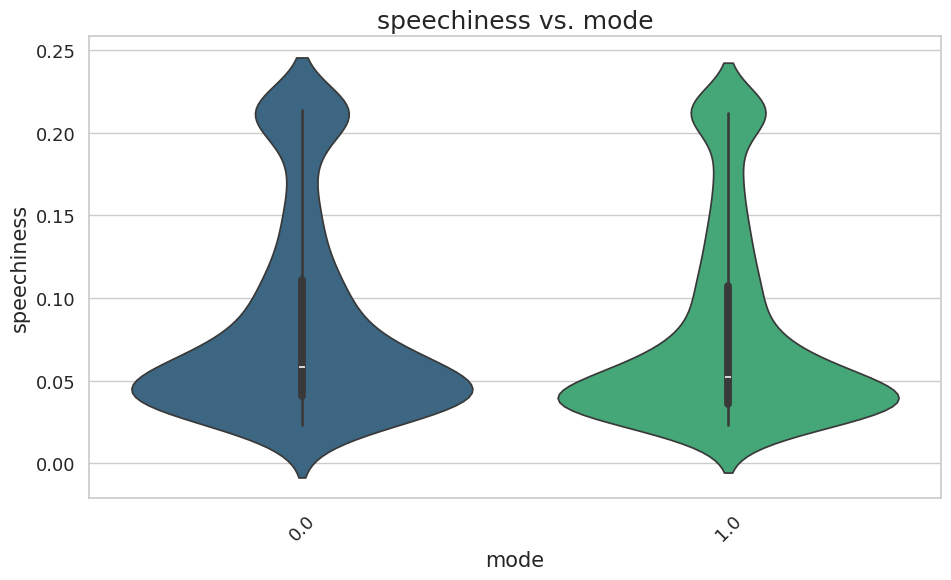

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


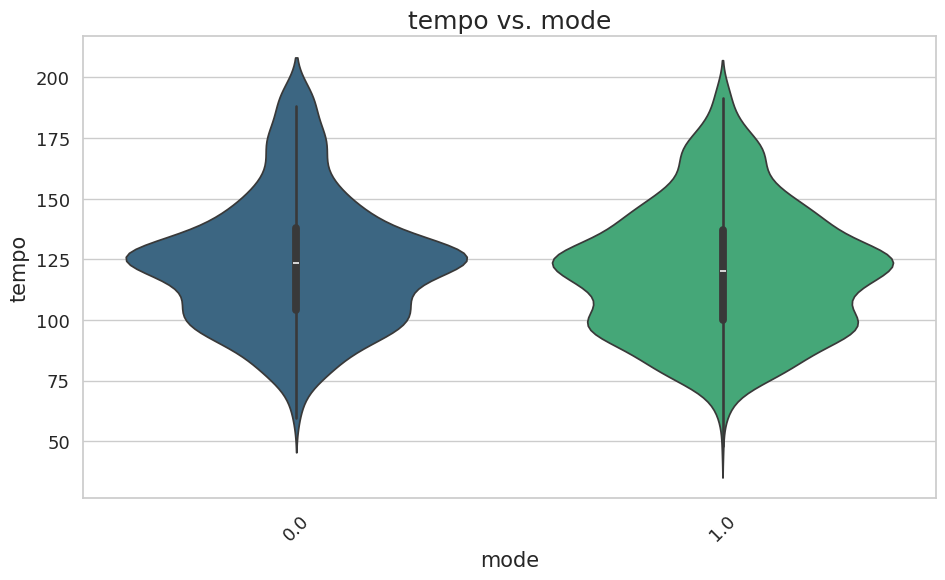

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


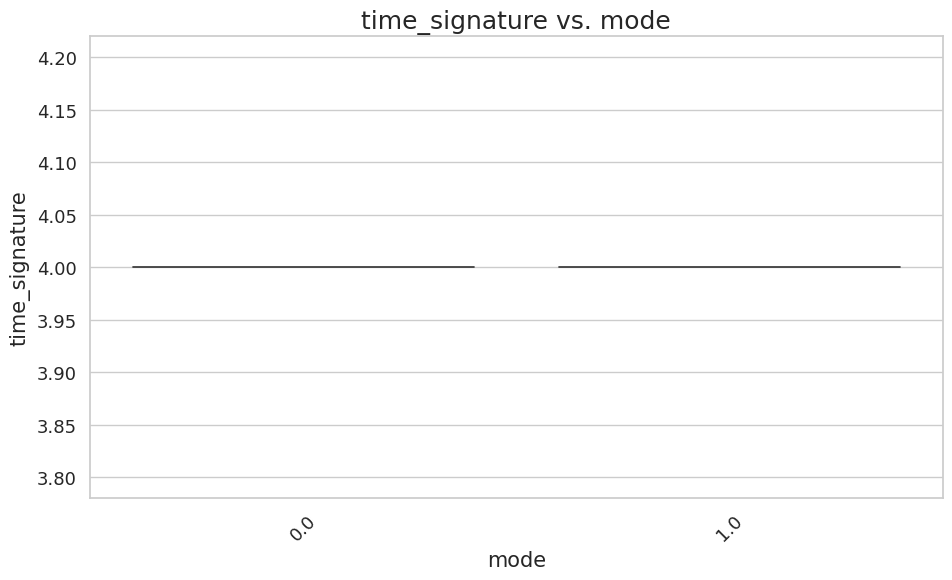

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


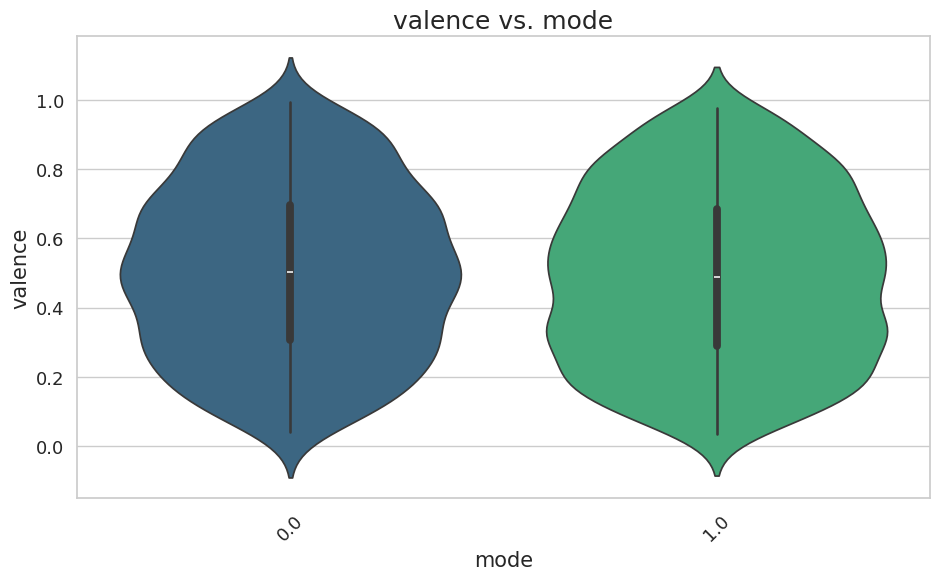

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


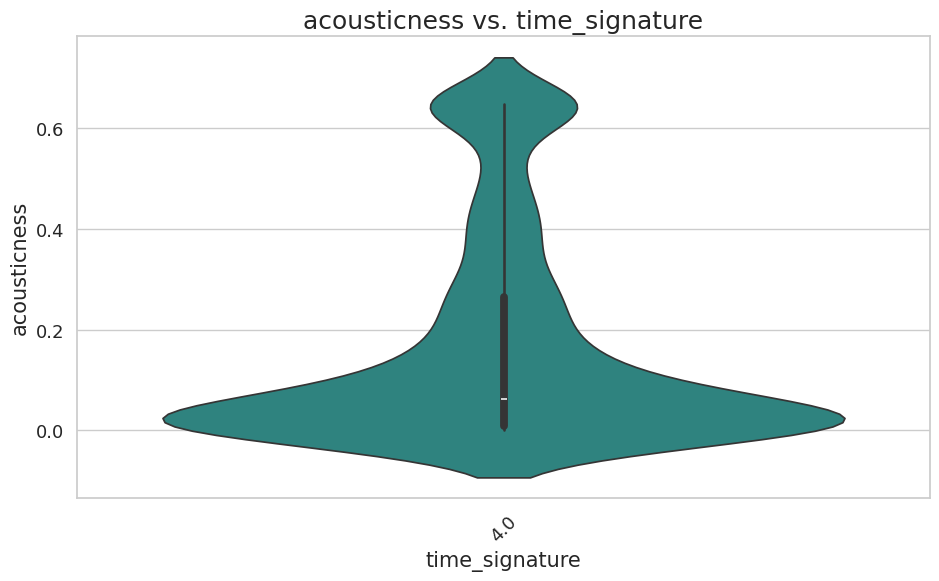

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


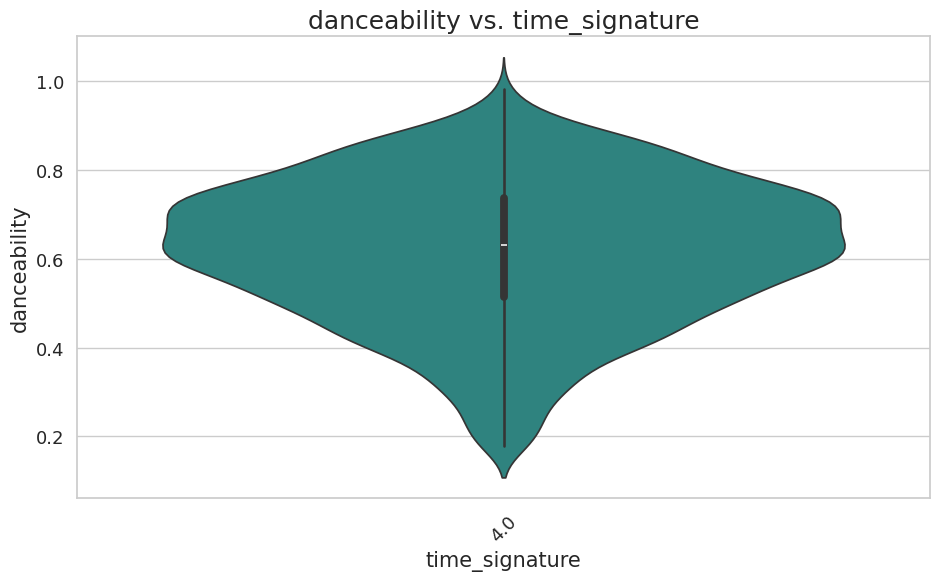

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


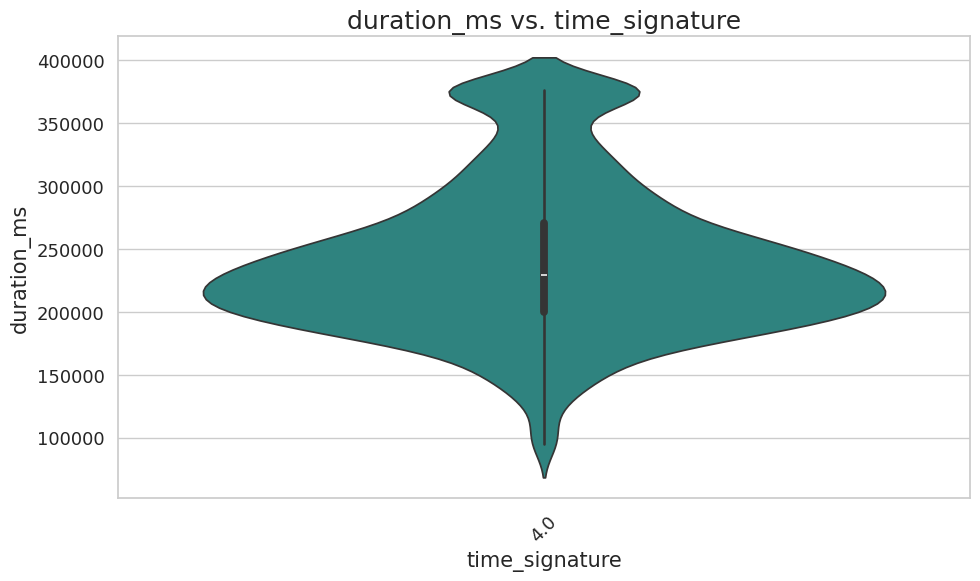

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


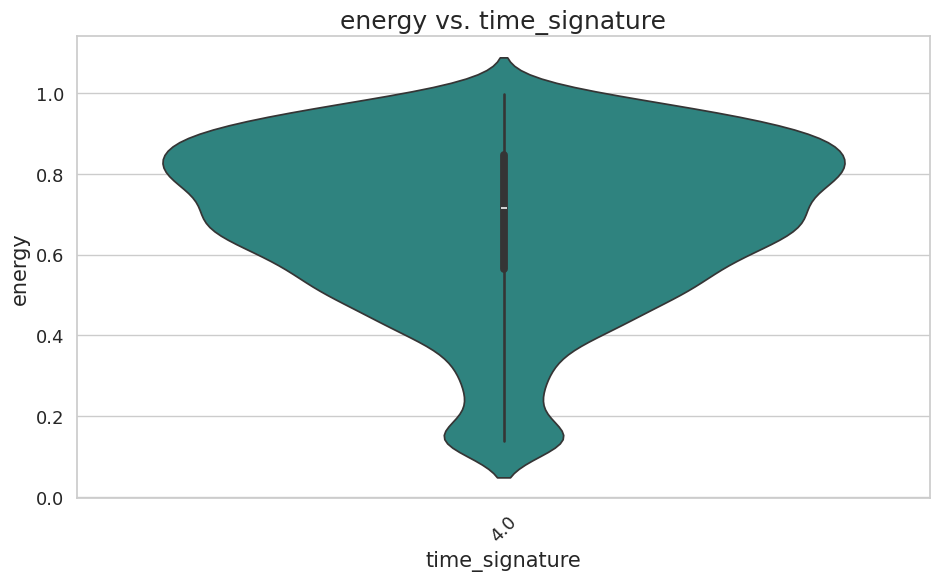

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


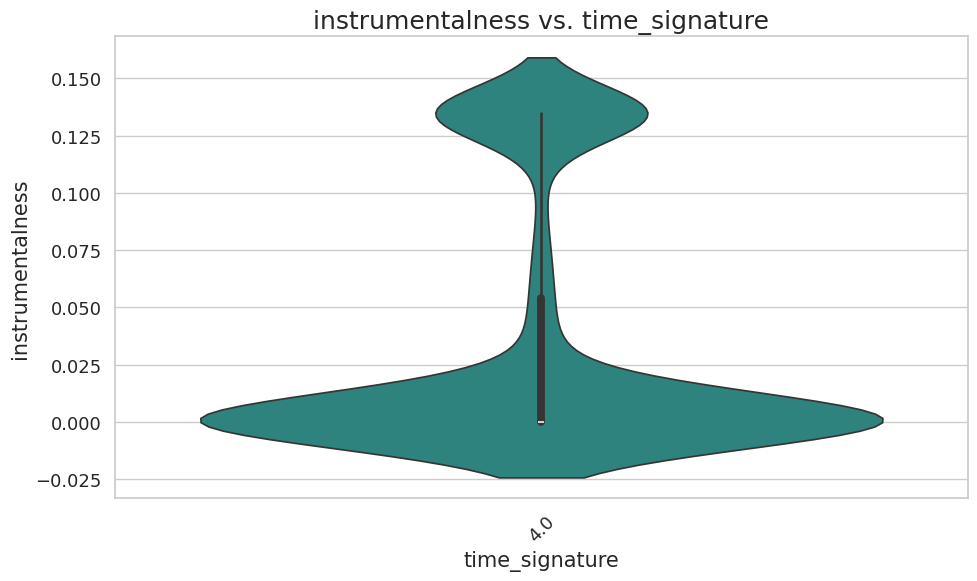

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


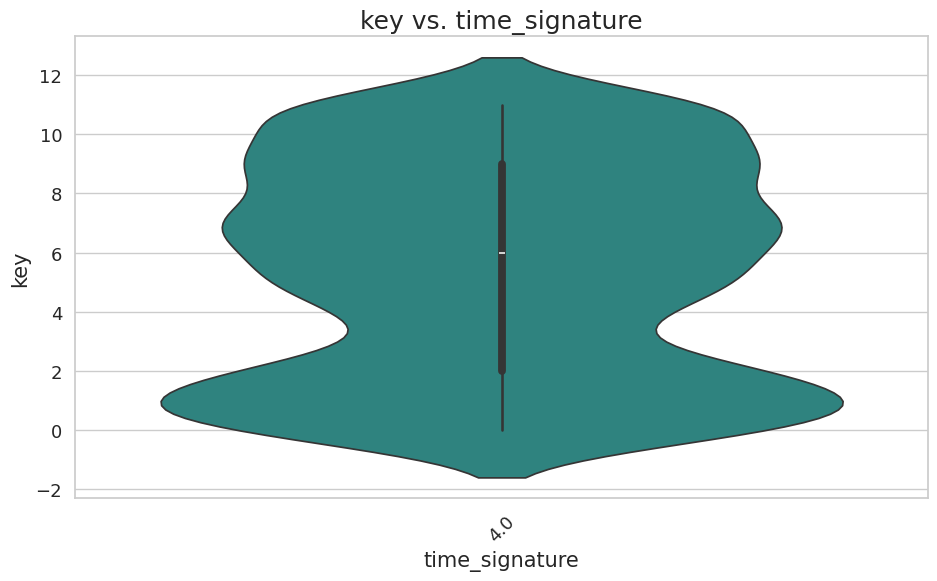

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


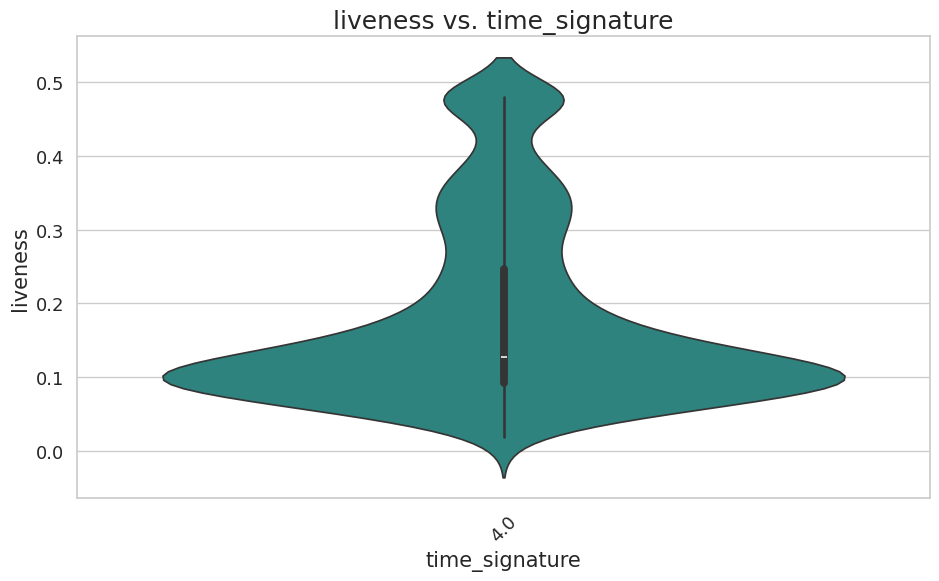

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


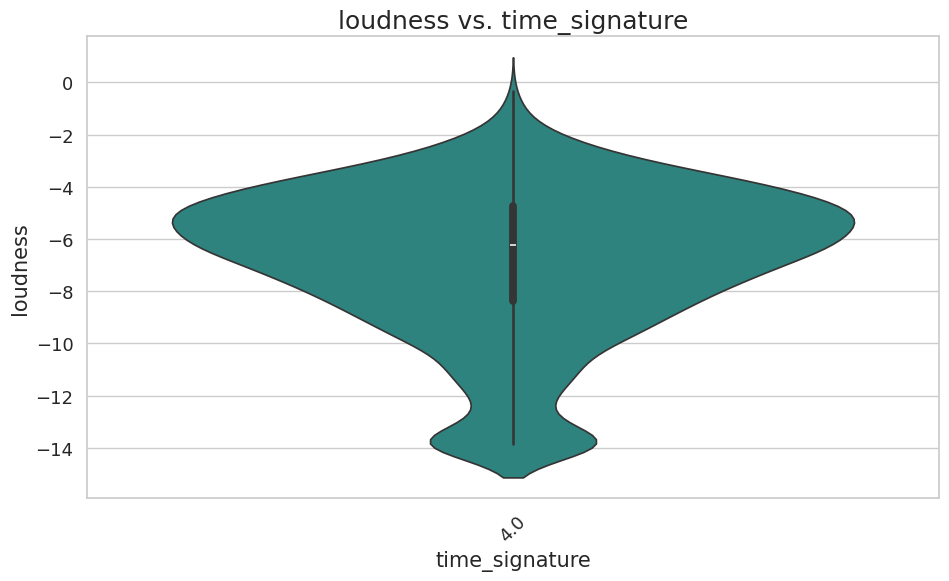

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


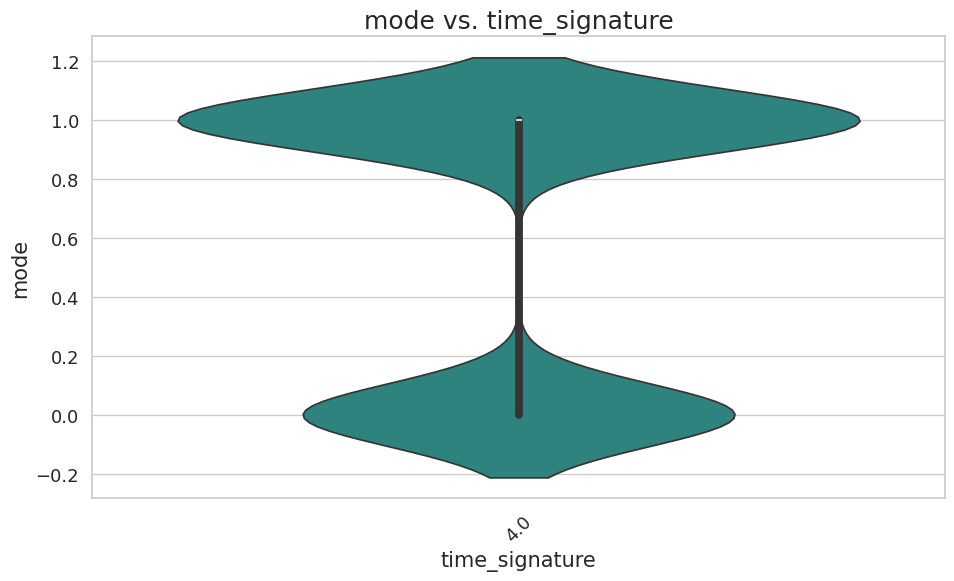

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


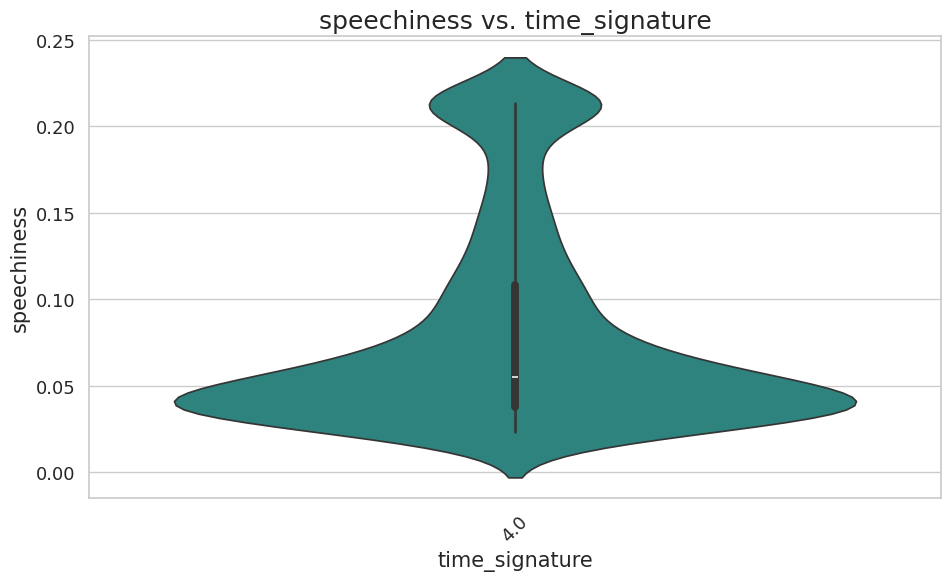

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


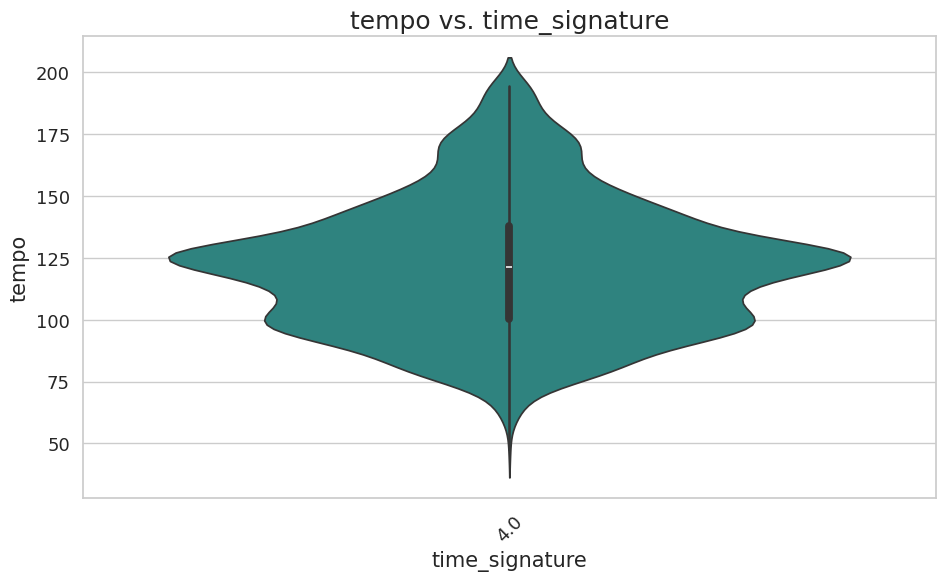

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


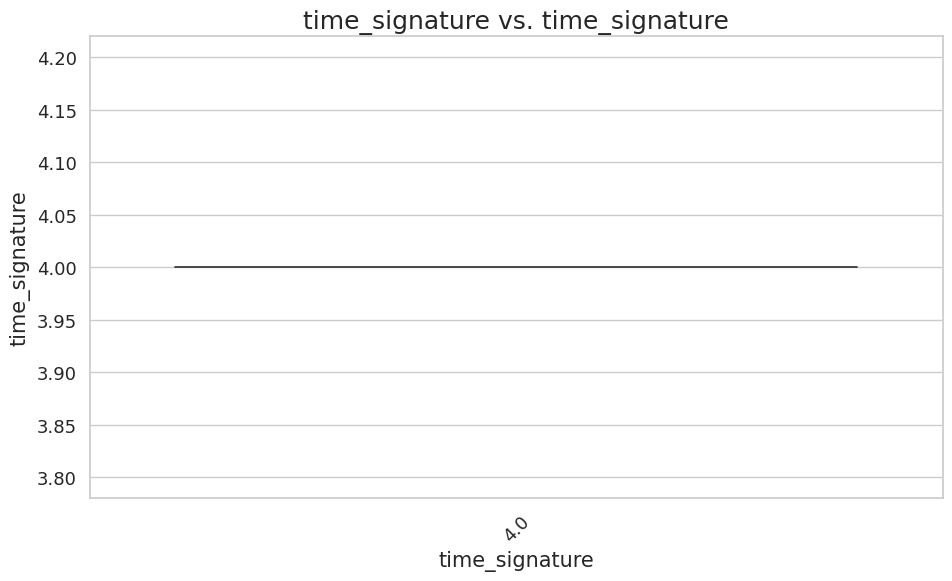

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


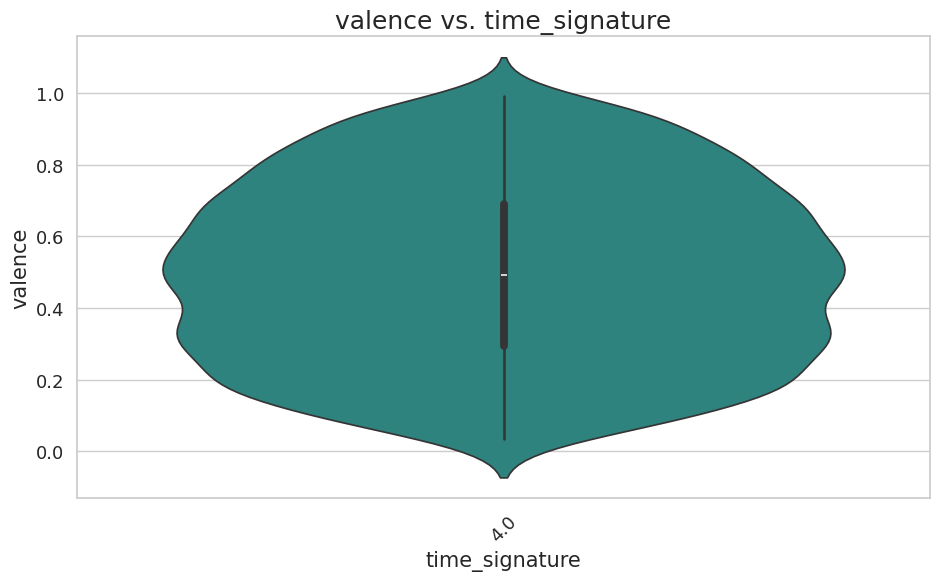

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


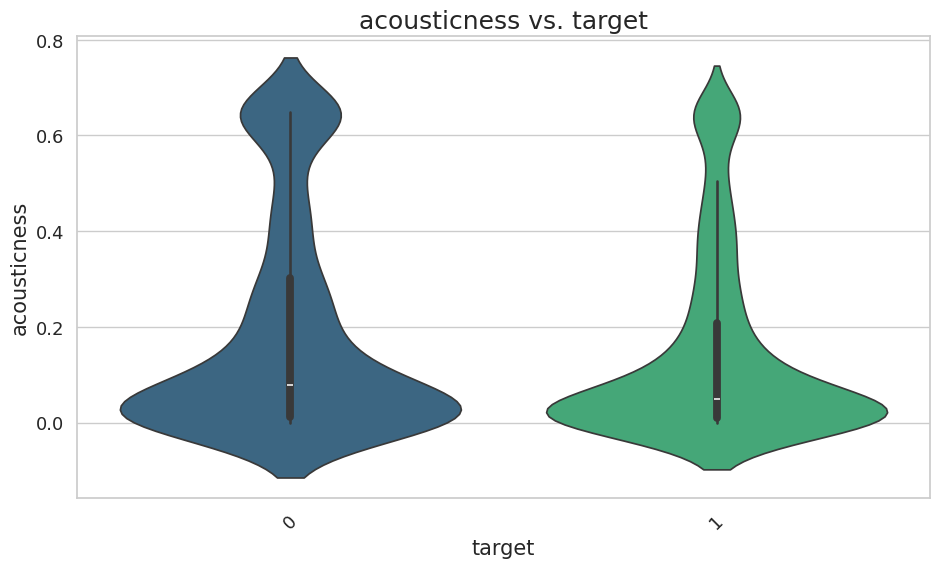

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


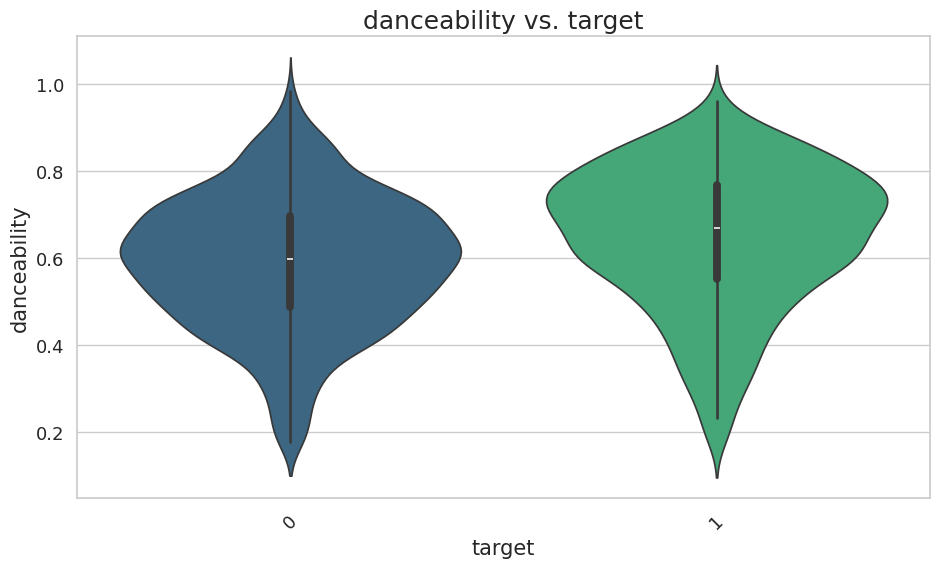

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


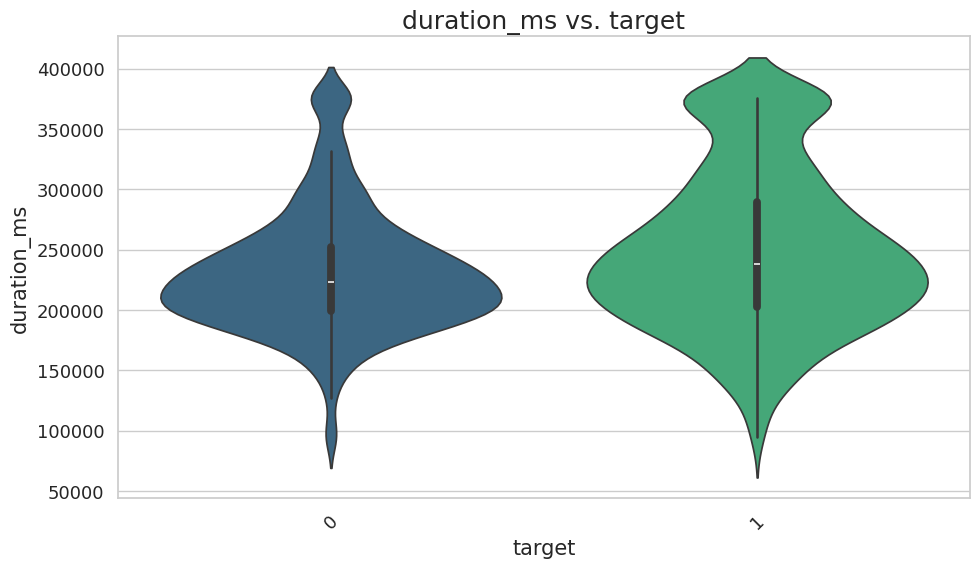

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


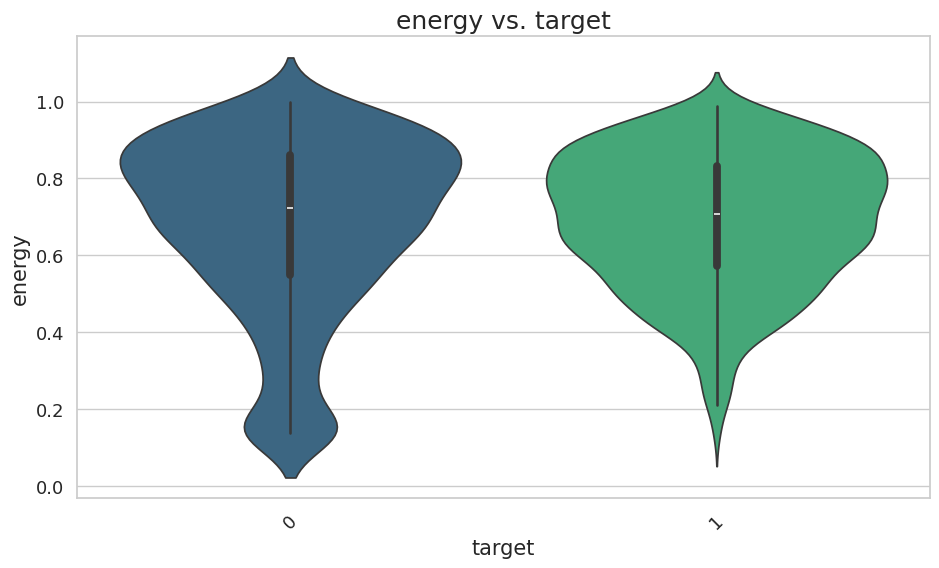

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


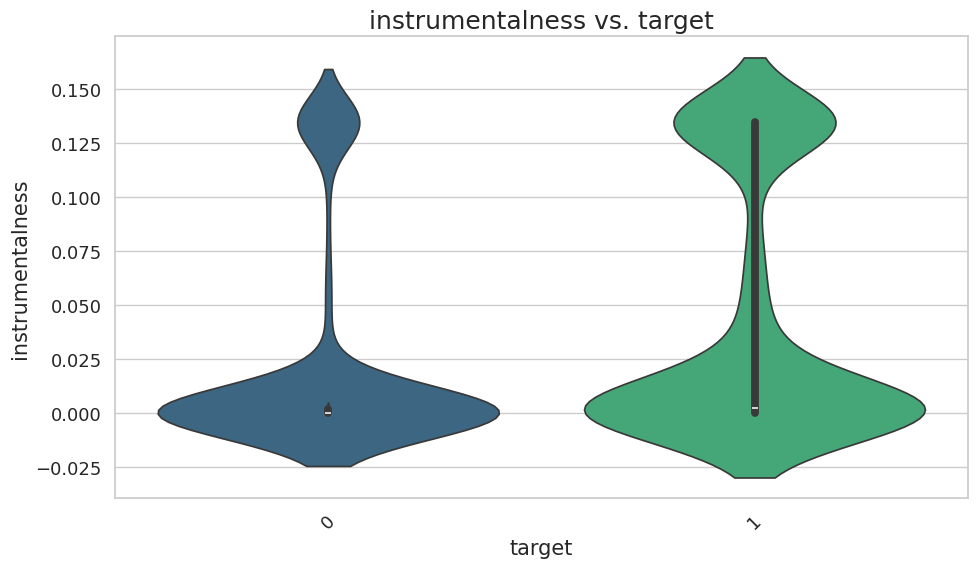

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


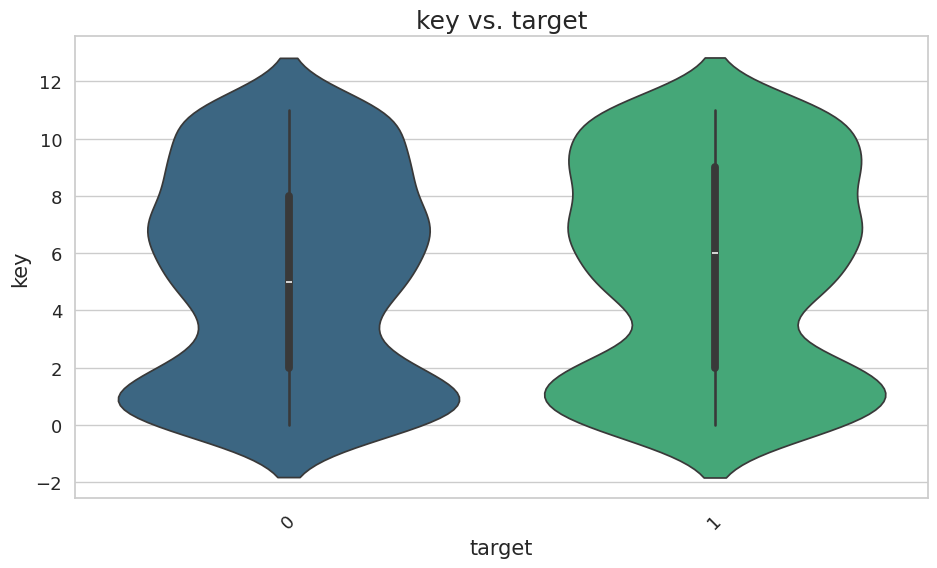

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


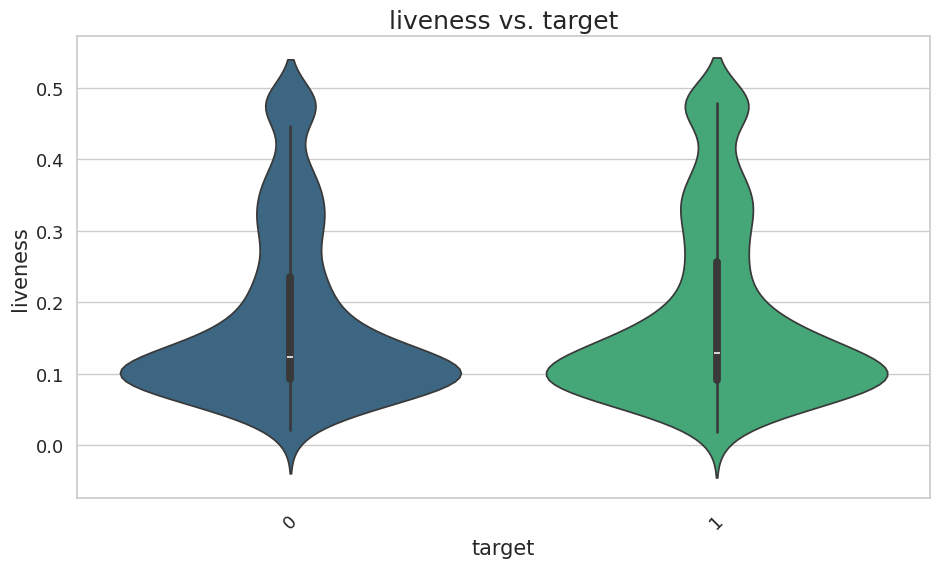

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


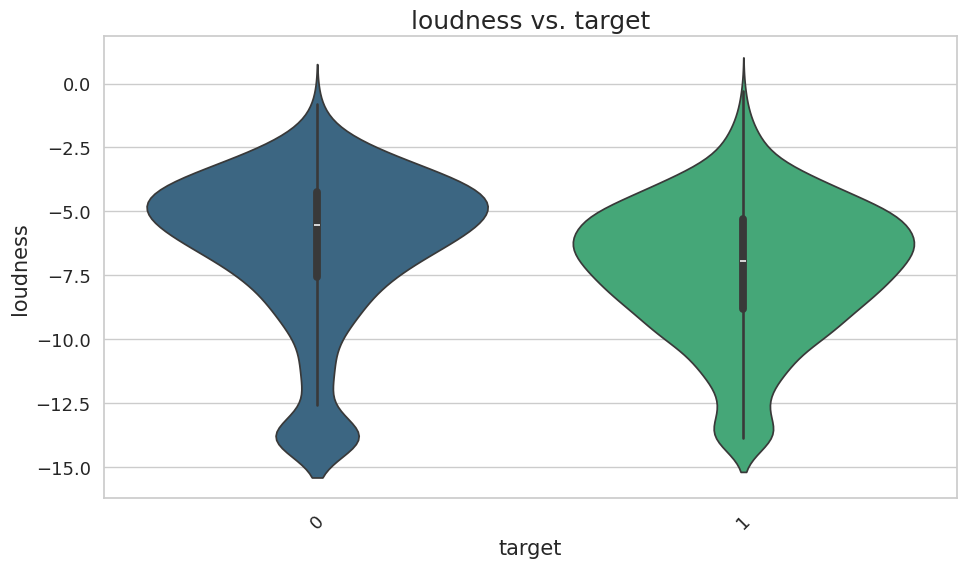

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


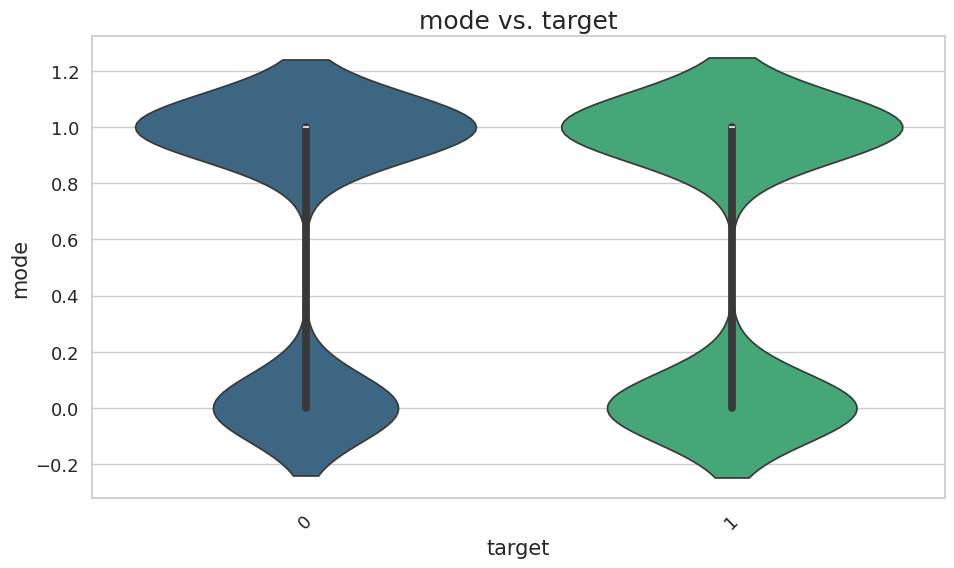

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


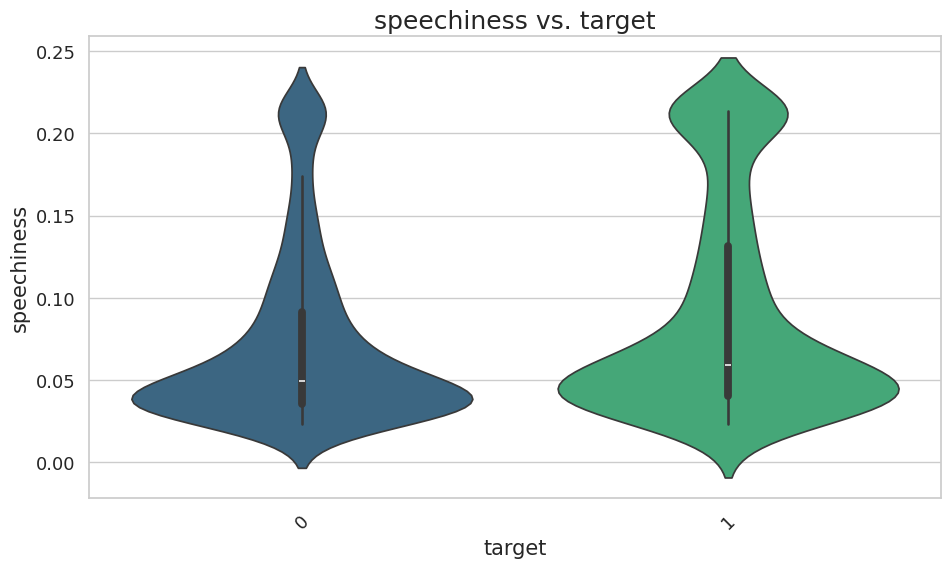

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


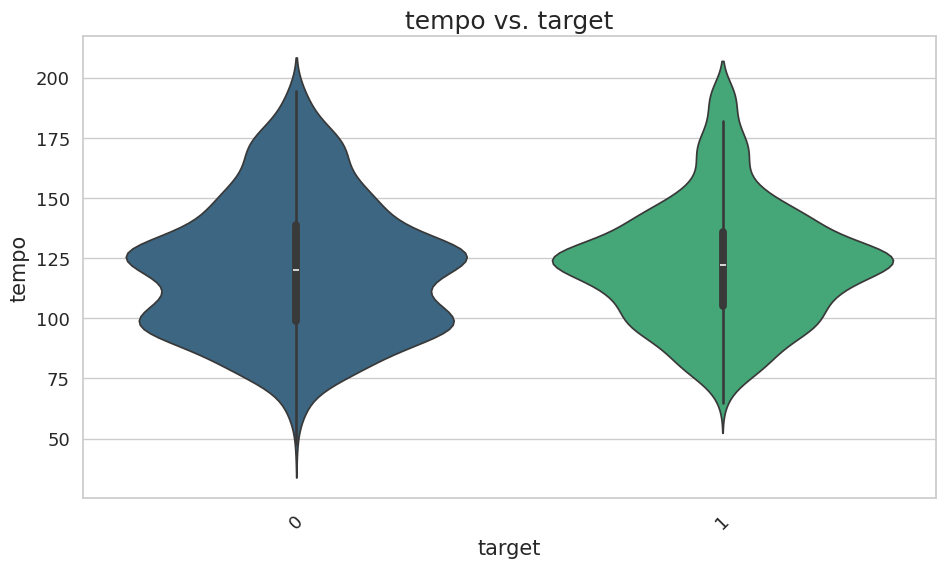

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


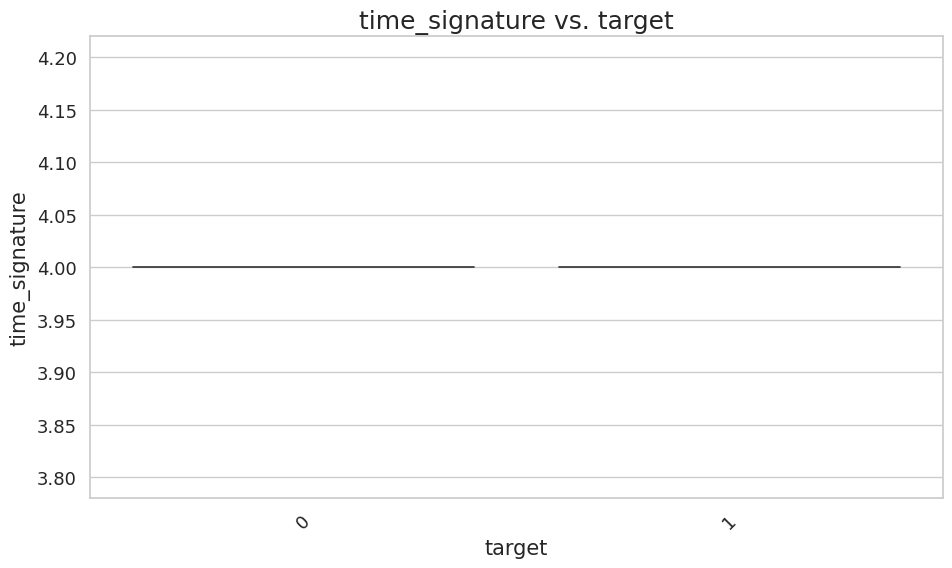

<ipython-input-41-43cd4be9ea51>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')


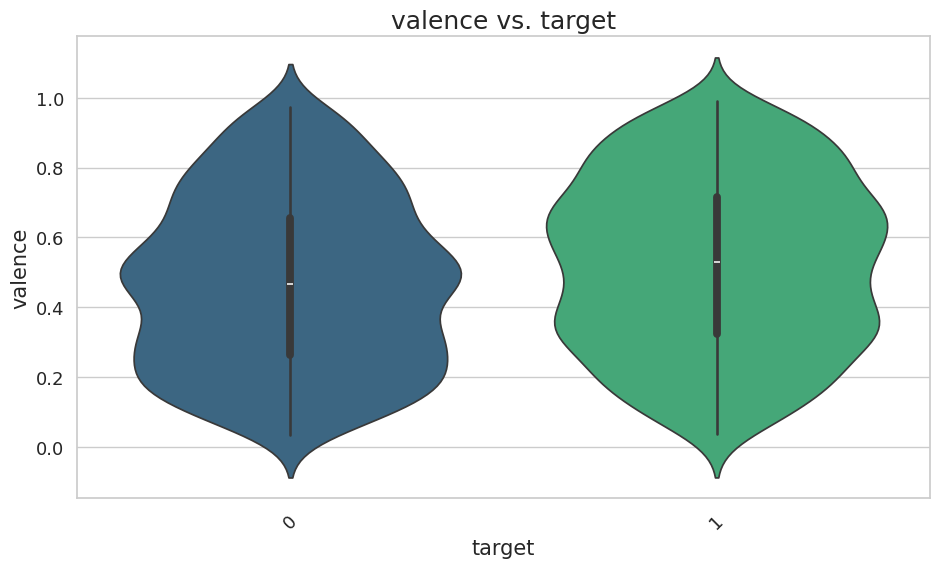

In [41]:
# Correlation heatmap

# Computing the correlation matrix
correlation_matrix = df[numeric_features].corr()

# Presenting the correlation using a heatmap
plt.figure(figsize=(13, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu', linewidths=.5, fmt=".2f")
plt.title('Heatmap showing feature correlations', fontsize=20)
plt.show()

# Scatter matrix
sns.pairplot(df[numeric_features], diag_kind='kde', markers='o', palette='husl')
plt.suptitle('Pair plots for numeric columns', y=1.02, fontsize=20)
plt.show()

# Bar plots showing cat vs numerical
for categorical in discrete_features:
    for numerical in numeric_features:
        plt.figure(figsize=(11, 6))
        sns.barplot(x=categorical, y=numerical, data=df, palette='viridis')
        plt.title(f'{numerical} vs. {categorical}', fontsize=18)
        plt.xticks(rotation=45)
        plt.show()

# Violin plots showing cat vs numerical
for categorical in discrete_features:
    for numerical in numeric_features:
        plt.figure(figsize=(11, 6))
        sns.violinplot(x=categorical, y=numerical, data=df, palette='viridis')
        plt.title(f'{numerical} vs. {categorical}', fontsize=18)
        plt.xticks(rotation=45)
        plt.show()

# Analysis of Multiple Features Together

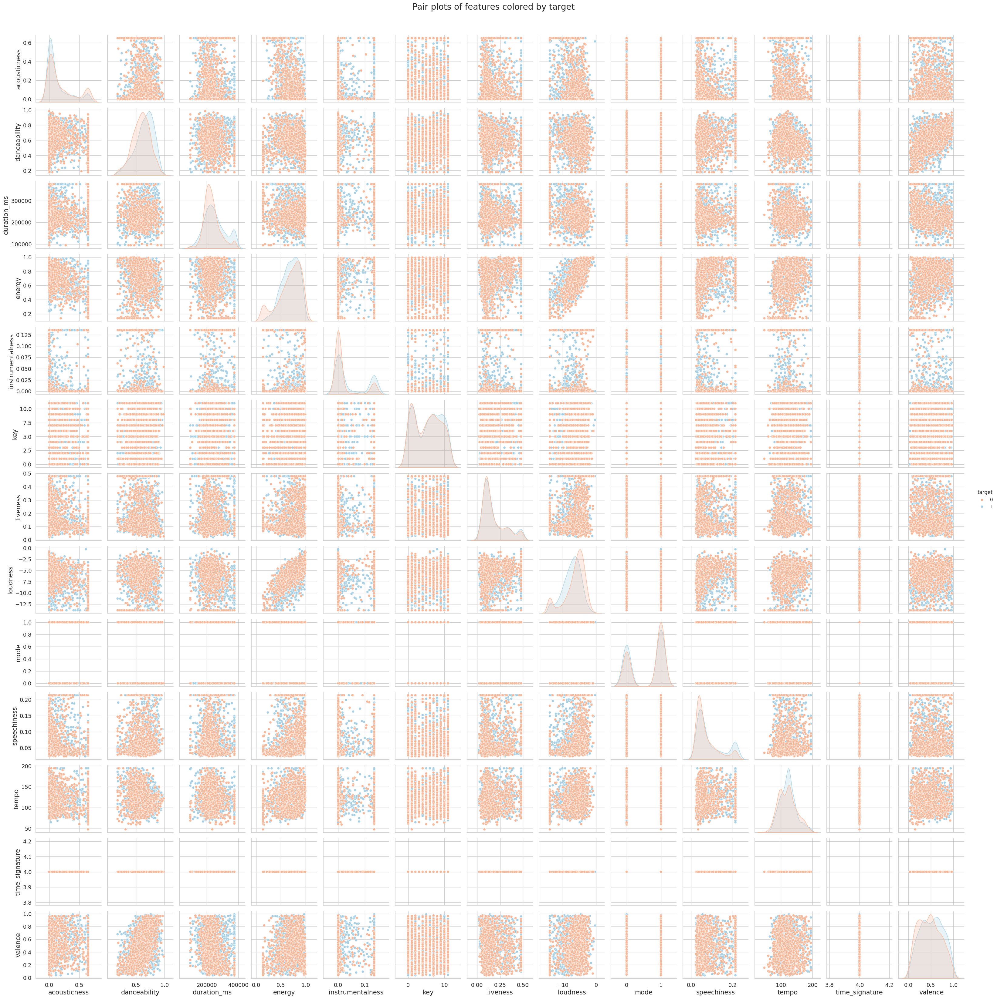

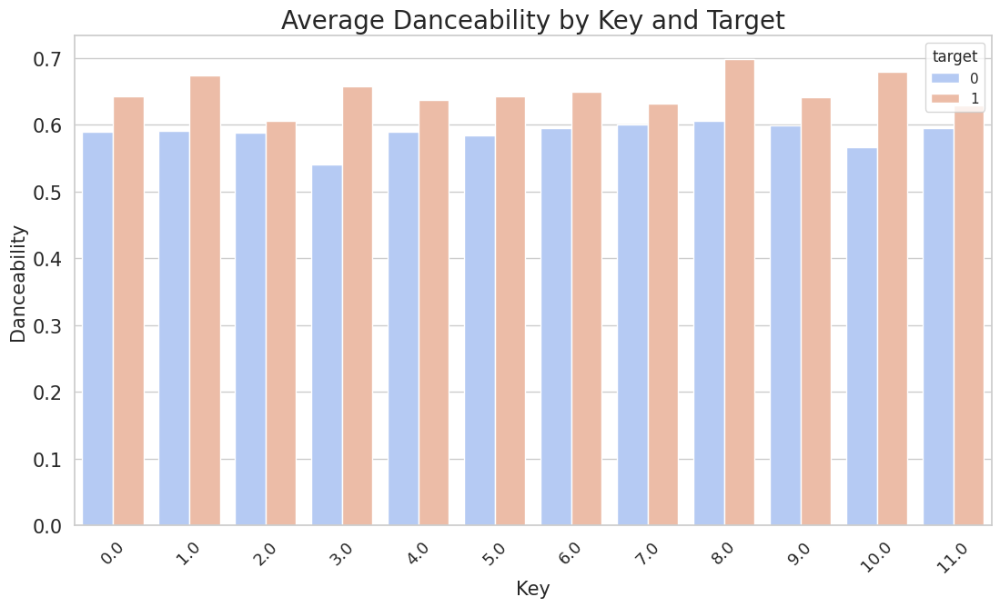

In [42]:
# Pair plot showing features together, with color code being based on one variable.
sns.pairplot(df, vars=numeric_features, hue='target', palette='RdBu')
plt.suptitle('Pair plots of features colored by target', y=1.02, fontsize=20)
plt.show()

# Showing grouped analysis
grouped_analysis = df.groupby(['target', 'key'])['danceability'].mean().reset_index()
plt.figure(figsize=(13, 7))
sns.barplot(x='key', y='danceability', hue='target', data=grouped_analysis, palette='coolwarm')
plt.title('Average Danceability by Key and Target', fontsize=20)
plt.xlabel('Key', fontsize=15)
plt.ylabel('Danceability', fontsize=15)
plt.xticks(rotation=45)
plt.yticks(fontsize=15)
plt.show()